## NOTEBOOK TESIS FINAL

En primer lugar importo las librerias necesarias para trabajar la tesis 

In [1]:
import pandasql as ps
import pandas as pd
import chart_studio.plotly as py
import plotly.graph_objs as go
# Offline mode
from plotly.offline import init_notebook_mode, iplot, plot
init_notebook_mode(connected='true')
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
from torch.utils.data import random_split, TensorDataset  
from torch.autograd import Variable 
import numpy as np
import os
import statsmodels as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, acf, pacf
from statsmodels.tsa import api as smt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn import preprocessing

### Base Demanda Epec

En esta sección voy a cargar los data frame y organizar las tablas para visualizarlas y limpiarlas

In [2]:
# Definir el separador y cargar el archivo CSV
separador = ';'
trainv6 = pd.read_csv('./../bases/demandaepecv8csv.csv', sep=separador, encoding='ISO-8859-1')

# Eliminar filas con valores nulos y restablecer el índice
trainv6 = trainv6.dropna()
trainv6 = trainv6.reset_index(drop=True)

#Para ordenar la columna Fecha del data frame para que pase de tener el formato de pandas 21/7/2023 23:00 al formato '2019-12-31 00:00:00'
trainv6['Fecha'] = pd.to_datetime(trainv6['Fecha'], format='%d/%m/%Y %H:%M')
trainv6['Fecha'] = trainv6['Fecha'].dt.strftime('%Y-%m-%d %H:%M:%S')

# Duplicar la columna 'Fecha sin hora' y convertirla al formato '2019-01'
trainv6['Fecha-Mes'] = pd.to_datetime(trainv6['Fecha sin hora'], format='%d/%m/%Y').dt.strftime('%Y-%m')

# Reordenar las columnas fecha, fecha sin hora y fecha-mes
column_order = ['Fecha', 'Fecha sin hora', 'Fecha-Mes'] + [col for col in trainv6.columns if col not in ['Fecha', 'Fecha sin hora', 'Fecha-Mes']]
trainv6 = trainv6[column_order]

#Ahora vamos a copiar la columna Fecha a otra columna y usar la funcion pop para extraer la columna y guardarla en una variable temporal
trainv6['Fecha_copia'] = trainv6['Fecha']
fecha_copia = trainv6.pop('Fecha_copia')

# Usando insert() para insertar la columna en la posición deseada con el nuevo nombre
posicion_deseada = trainv6.columns.get_loc('Demanda')
trainv6.insert(posicion_deseada, 'Fecha_columna', fecha_copia)

# Ordena el DataFrame por la columna 'Fecha'
trainv6['Fecha'] = pd.to_datetime(trainv6['Fecha'])
trainv6 = trainv6.sort_values(by='Fecha')

# Convertir las columnas a números en formato float
trainv6['Demanda'] = trainv6['Demanda'].str.replace(',', '.').astype(float)
trainv6['Temperatura'] = trainv6['Temperatura'].str.replace(',', '.').astype(float)
columnas_a_convertir_float = ['Potencia maxima', 'E valle', 'E resto', 'E pico', 'E total', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento']
trainv6[columnas_a_convertir_float] = trainv6[columnas_a_convertir_float].replace(',', '.', regex=True).astype(float)

# Convertir la columna 'Fecha sin hora' y 'Fecha-Mes' a tipo datetime
trainv6['Fecha sin hora'] = pd.to_datetime(trainv6['Fecha sin hora'], format='%d/%m/%Y')
trainv6['Fecha-Mes'] = pd.to_datetime(trainv6['Fecha-Mes'], format='%Y-%m')

#Mostrar el data frame:
trainv6

,Fecha,Fecha sin hora,Fecha-Mes,Ano,Mes,Dia,Dia de la semana,Hora-num,Hora,Fecha_columna,...,E pico,E total,Nombre de la semana,Tipo de dia,Laborabilidad,Estacion,Temperatura,Humedad,Acumulacion de lluvia,Rafaga de viento
0,2019-01-01 00:00:00,2019-01-01,2019-01-01,2019,1,1,1,0,00:00:00,2019-01-01 00:00:00,...,6202.45,25623.35,martes,Feriado,0,Verano,26.80,65.32,0.0,11.3
1,2019-01-01 01:00:00,2019-01-01,2019-01-01,2019,1,1,1,1,01:00:00,2019-01-01 01:00:00,...,6202.45,25623.35,martes,Feriado,0,Verano,26.55,65.62,0.0,0.0
2,2019-01-01 02:00:00,2019-01-01,2019-01-01,2019,1,1,1,2,02:00:00,2019-01-01 02:00:00,...,6202.45,25623.35,martes,Feriado,0,Verano,26.40,66.32,0.0,0.0
3,2019-01-01 03:00:00,2019-01-01,2019-01-01,2019,1,1,1,3,03:00:00,2019-01-01 03:00:00,...,6202.45,25623.35,martes,Feriado,0,Verano,26.40,66.75,0.0,0.0
4,2019-01-01 04:00:00,2019-01-01,2019-01-01,2019,1,1,1,4,04:00:00,2019-01-01 04:00:00,...,6202.45,25623.35,martes,Feriado,0,Verano,26.35,68.05,0.0,36.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46003,2024-03-31 19:00:00,2024-03-31,2024-03-01,2024,3,31,6,19,19:00:00,2024-03-31 19:00:00,...,5198.74,22469.45,domingo,Domingo,0,Otono,24.40,30.88,0.0,147.4
46004,2024-03-31 20:00:00,2024-03-31,2024-03-01,2024,3,31,6,20,20:00:00,2024-03-31 20:00:00,...,5198.74,22469.45,domingo,Domingo,0,Otono,23.42,34.13,0.0,158.7
46005,2024-03-31 21:00:00,2024-03-31,2024-03-01,2024,3,31,6,21,21:00:00,2024-03-31 21:00:00,...,5198.74,22469.45,domingo,Domingo,0,Otono,22.58,37.60,0.0,155.5
46006,2024-03-31 22:00:00,2024-03-31,2024-03-01,2024,3,31,6,22,22:00:00,2024-03-31 22:00:00,...,5198.74,22469.45,domingo,Domingo,0,Otono,21.63,52.40,0.0,133.0


In [3]:
# Supongamos que 'trainv6' es tu DataFrame
columnas_trainv6 = trainv6.columns.tolist()

# Muestra la lista de columnas
print(columnas_trainv6)

['Fecha', 'Fecha sin hora', 'Fecha-Mes', 'Ano', 'Mes', 'Dia', 'Dia de la semana', 'Hora-num', 'Hora', 'Fecha_columna', 'Demanda', 'Potencia maxima', 'HHMM-num', 'HHMM', 'E valle', 'E resto', 'E pico', 'E total', 'Nombre de la semana', 'Tipo de dia', 'Laborabilidad', 'Estacion', 'Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento']


Para eliminar los OUTLIERS

In [4]:
import pandas as pd

# Asegúrate de que 'Fecha' sea de tipo datetime
trainv6['Fecha'] = pd.to_datetime(trainv6['Fecha'])

# Establece un límite inferior para reemplazar valores por debajo de él
lower_limit = 500  # Puedes ajustar este límite según tus necesidades

# Almacena los índices de las filas que serán reemplazadas
indices_reemplazados = trainv6.index[trainv6['Demanda'] < lower_limit]

for index in indices_reemplazados:
    # Obtiene la fecha de la fila actual
    fecha_actual = trainv6.loc[index, 'Fecha']
    
    # Calcula la fecha de la misma hora de la semana anterior
    fecha_semana_anterior = fecha_actual - pd.DateOffset(weeks=1)
    
    # Busca el valor de la misma hora de la semana anterior
    valor_semana_anterior = trainv6.loc[(trainv6['Fecha'] == fecha_semana_anterior) & (trainv6['Fecha'].dt.hour == fecha_actual.hour), 'Demanda'].values
    
    # Reemplaza el valor por el de la misma hora de la semana anterior
    if len(valor_semana_anterior) > 0:
        trainv6.loc[index, 'Demanda'] = valor_semana_anterior[0]

# Imprime la fecha y el valor de demanda que fueron reemplazados
print("Datos reemplazados por debajo del límite:")
print(trainv6.loc[indices_reemplazados, ['Fecha', 'Demanda']])



Datos reemplazados por debajo del límite:
                    Fecha  Demanda
3991  2019-06-16 07:00:00   826.30
3992  2019-06-16 08:00:00   766.07
3993  2019-06-16 09:00:00   829.06
3994  2019-06-16 10:00:00   884.66
3995  2019-06-16 11:00:00   898.89
3996  2019-06-16 12:00:00   892.83
3997  2019-06-16 13:00:00   862.47
3998  2019-06-16 14:00:00   828.84
3999  2019-06-16 15:00:00   821.98
36497 2023-03-01 17:00:00  1168.15
36498 2023-03-01 18:00:00  1154.89


Para armar un resultado por Año sobre la media de las principales variables 

In [5]:
# Asegúrate de que 'Fecha' sea de tipo datetime
trainv6['Fecha'] = pd.to_datetime(trainv6['Fecha'])

# Extraer el año y crear una nueva columna llamada 'Año'
trainv6['Año'] = trainv6['Fecha'].dt.year

# Lista de columnas para las cuales deseas calcular la media
columnas_para_media = [
    'Demanda', 'Potencia maxima', 'Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento'
]

# Redondear todas las columnas a un decimal
trainv6[columnas_para_media] = trainv6[columnas_para_media].round(1)

# Calcular la media después de agrupar por año
resultados_por_año = trainv6.groupby('Año')[columnas_para_media].mean()
resultados_por_año



,Demanda,Potencia maxima,Temperatura,Humedad,Acumulacion de lluvia,Rafaga de viento
Año,,,,,,
2019,1045.344326,1294.078356,19.632580,57.078550,0.054566,53.311815
2020,1028.638513,1268.310929,20.059335,49.270219,0.105760,101.152880
2021,1072.412283,1309.637808,18.353950,60.487477,0.076142,97.339680
2022,1150.634064,1399.773425,19.110571,51.526005,0.052397,120.638870
2023,1160.274441,1410.823288,20.185674,56.424132,0.057534,126.360411
2024,1246.028571,1507.254945,25.468086,66.242857,0.162088,119.345513


In [6]:
import pandas as pd

# Supongamos que 'trainv6' es tu DataFrame actual
# (Asegúrate de haber ejecutado previamente la conversión de la columna 'Fecha' a formato datetime)

# Crear un nuevo DataFrame agrupando por día y calculando la media de la demanda
daily_demand = trainv6.groupby(trainv6['Fecha'].dt.date)['Demanda'].mean().reset_index()


# Agregar las columnas al DataFrame
daily_demand['Demanda_Media'] = trainv6.groupby(trainv6['Fecha'].dt.date)['Demanda'].mean().values
daily_demand['Temperatura_Max'] = trainv6.groupby(trainv6['Fecha'].dt.date)['Temperatura'].max().values
daily_demand['Temperatura_Min'] = trainv6.groupby(trainv6['Fecha'].dt.date)['Temperatura'].min().values
daily_demand['Temperatura_Media'] = trainv6.groupby(trainv6['Fecha'].dt.date)['Temperatura'].mean().values
daily_demand['Humedad_Media'] = trainv6.groupby(trainv6['Fecha'].dt.date)['Humedad'].mean().values
daily_demand['Lluvia_Acumulada'] = trainv6.groupby(trainv6['Fecha'].dt.date)['Acumulacion de lluvia'].sum().values
daily_demand['Rafaga_viento'] = trainv6.groupby(trainv6['Fecha'].dt.date)['Rafaga de viento'].sum().values
# Mostrar el DataFrame resultante
daily_demand


,Fecha,Demanda,Demanda_Media,Temperatura_Max,Temperatura_Min,Temperatura_Media,Humedad_Media,Lluvia_Acumulada,Rafaga_viento
0,2019-01-01,1067.645833,1067.645833,35.6,25.3,30.120833,60.187500,0.0,969.6
1,2019-01-02,1425.204167,1425.204167,40.3,22.9,30.829167,54.687500,4.0,2391.6
2,2019-01-03,1078.966667,1078.966667,29.2,16.9,23.466667,51.970833,0.0,2973.7
3,2019-01-04,1111.125000,1111.125000,28.8,20.2,24.066667,70.733333,0.0,3851.0
4,2019-01-05,1099.800000,1099.800000,31.6,23.1,27.120833,65.579167,0.0,4536.6
...,...,...,...,...,...,...,...,...,...
1912,2024-03-27,1240.300000,1240.300000,30.8,20.6,23.795833,79.112500,34.0,2154.3
1913,2024-03-28,1196.016667,1196.016667,31.3,19.8,24.883333,70.200000,0.0,2019.7
1914,2024-03-29,1085.354167,1085.354167,32.0,21.1,26.020833,56.654167,0.0,3167.9
1915,2024-03-30,1154.908333,1154.908333,36.9,22.8,28.429167,50.533333,0.0,2821.3


 ### Visualización de variables para predecir

#### TEMPERATURA

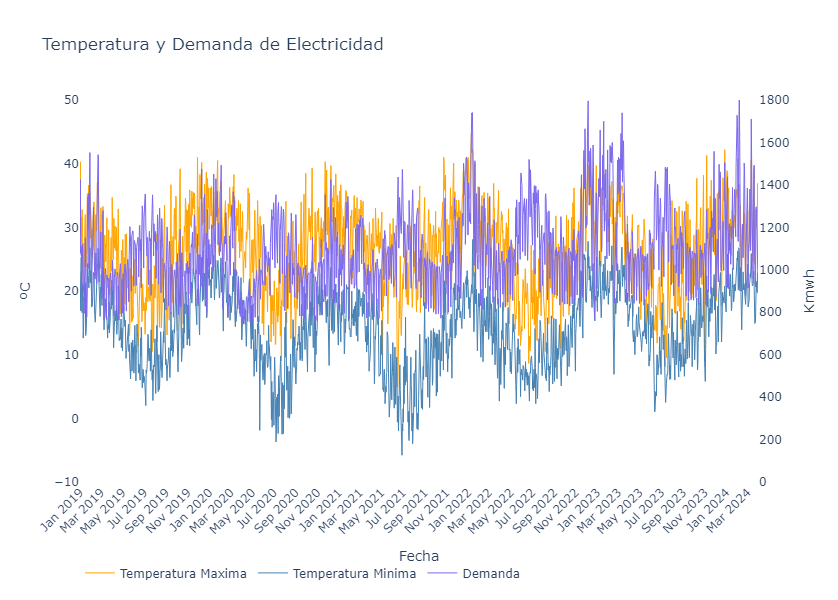

In [7]:
from matplotlib import pyplot as plt
import plotly.graph_objects as go

plt.style.use('default')

# Crear el gráfico
layout_temp = go.Layout(
    title='Temperatura y Demanda de Electricidad',
    xaxis=dict(title='Fecha', tickangle=-45, dtick='M2', showgrid=False),
    yaxis=dict(title='ºC', titlefont=dict(size=14), showgrid=False, range=[-10, 50]),  # Ajuste de rango para Temperatura
    yaxis2=dict(title='Kmwh', overlaying='y', side='right', titlefont=dict(size=14), showgrid=False, range=[0, 1800]),  # Ajuste de rango para Kmwh
    legend=dict(x=0, y=-0.2, traceorder='normal', orientation='h'),  # Posición y formato de la leyenda
)

temp_max = go.Scatter(x=daily_demand['Fecha'], y=daily_demand['Temperatura_Max'], name='Temperatura Maxima', line=dict(color='#FFA500', width=1), yaxis='y')
temp_min = go.Scatter(x=daily_demand['Fecha'], y=daily_demand['Temperatura_Min'], name='Temperatura Minima', line=dict(color='#4682B4', width=1), yaxis='y')
dem = go.Scatter(x=daily_demand['Fecha'], y=daily_demand['Demanda'], name='Demanda', line=dict(color='#7B68EE', width=1), yaxis='y2')

fig = go.Figure(data=[temp_max, temp_min, dem], layout=layout_temp)
fig.update_xaxes(title_text='Fecha')

# Configurar el color de fondo del gráfico y el área de trazado en blanco
fig.update_layout(
    paper_bgcolor='white',
    plot_bgcolor='white',
    width=1200,  # Ajustar el ancho del gráfico
    height=600   # Ajustar la altura del gráfico
)

fig.show()


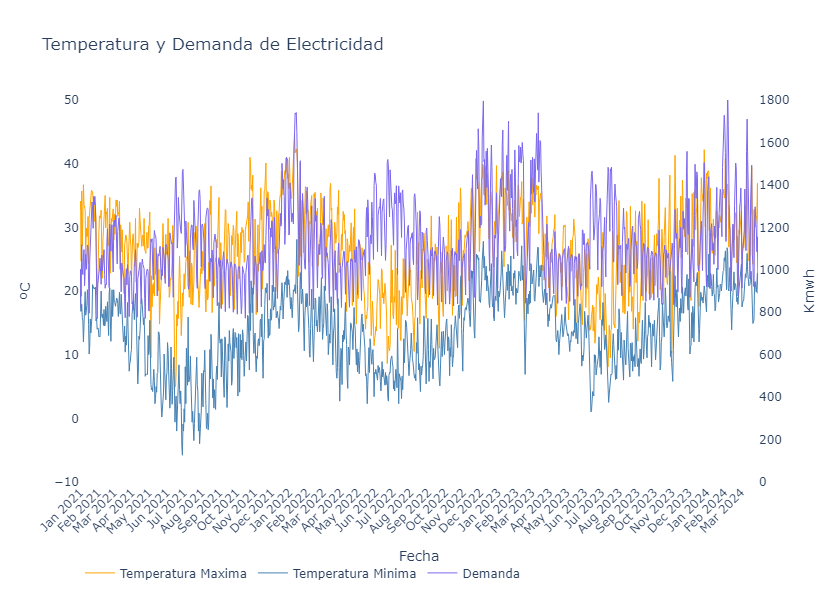

In [8]:
from matplotlib import pyplot as plt
import plotly.graph_objects as go

# Convertir la columna 'Fecha' a tipo datetime
daily_demand['Fecha'] = pd.to_datetime(daily_demand['Fecha'])

# Filtro para seleccionar datos de los años 2022, 2023 y 2024
filtered_data = daily_demand[(daily_demand['Fecha'].dt.year >= 2021) & (daily_demand['Fecha'].dt.year <= 2024)]

plt.style.use('default')

# Crear el gráfico
layout_temp = go.Layout(
    title='Temperatura y Demanda de Electricidad',
    xaxis=dict(title='Fecha', tickangle=-45, dtick='M1', showgrid=False),
    yaxis=dict(title='ºC', titlefont=dict(size=14), showgrid=False, range=[-10, 50]),  # Ajuste de rango para Temperatura
    yaxis2=dict(title='Kmwh', overlaying='y', side='right', titlefont=dict(size=14), showgrid=False, range=[0, 1800]),  # Ajuste de rango para Kmwh
    legend=dict(x=0, y=-0.2, traceorder='normal', orientation='h'),  # Posición y formato de la leyenda
)

temp_max = go.Scatter(x=filtered_data['Fecha'], y=filtered_data['Temperatura_Max'], name='Temperatura Maxima', line=dict(color='#FFA500', width=1), yaxis='y')
temp_min = go.Scatter(x=filtered_data['Fecha'], y=filtered_data['Temperatura_Min'], name='Temperatura Minima', line=dict(color='#4682B4', width=1), yaxis='y')
dem = go.Scatter(x=filtered_data['Fecha'], y=filtered_data['Demanda'], name='Demanda', line=dict(color='#7B68EE', width=1), yaxis='y2')

fig = go.Figure(data=[temp_max, temp_min, dem], layout=layout_temp)
fig.update_xaxes(title_text='Fecha')

# Configurar el color de fondo del gráfico y el área de trazado en blanco
fig.update_layout(
    paper_bgcolor='white',
    plot_bgcolor='white',
    width=1200,  # Ajustar el ancho del gráfico
    height=600   # Ajustar la altura del gráfico
)

fig.show()


#### HUMEDAD

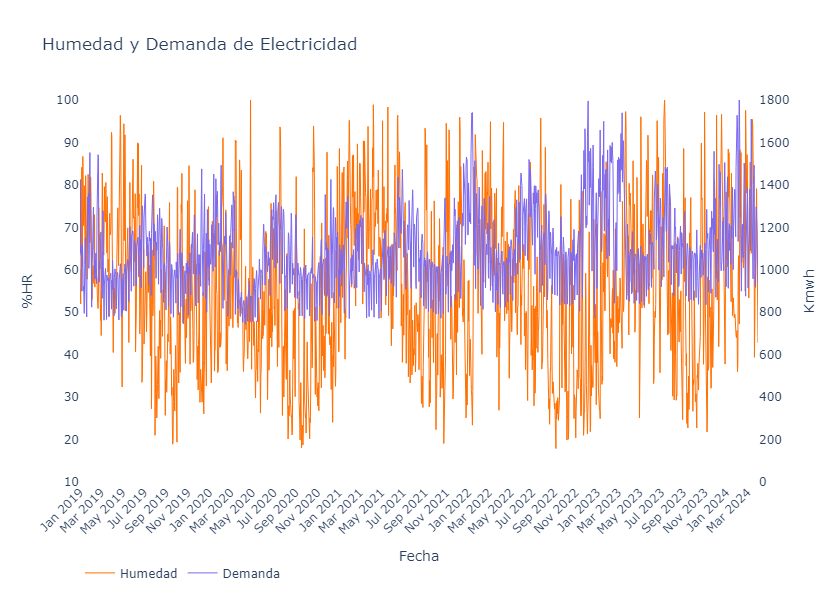

In [9]:
from matplotlib import pyplot as plt
import plotly.graph_objects as go

plt.style.use('default')

# Crear el gráfico
layout_temp = go.Layout(
    title='Humedad y Demanda de Electricidad',
    xaxis=dict(title='Fecha', tickangle=-45, dtick='M2', showgrid=False),
    yaxis=dict(title='%HR', titlefont=dict(size=14), showgrid=False, range=[10, 100]),  # Ajuste de rango para Temperatura
    yaxis2=dict(title='Kmwh', overlaying='y', side='right', titlefont=dict(size=14), showgrid=False, range=[0, 1800]),  # Ajuste de rango para Kmwh
    legend=dict(x=0, y=-0.2, traceorder='normal', orientation='h'),  # Posición y formato de la leyenda
)

Hum = go.Scatter(x=daily_demand['Fecha'], y=daily_demand['Humedad_Media'], name='Humedad', line=dict(color='#FF6F00', width=1), yaxis='y')
dem = go.Scatter(x=daily_demand['Fecha'], y=daily_demand['Demanda'], name='Demanda', line=dict(color='#7B68EE', width=1), yaxis='y2')

# Corregir el nombre de la traza en la figura
fig = go.Figure(data=[Hum, dem], layout=layout_temp)
fig.update_xaxes(title_text='Fecha')

# Configurar el color de fondo del gráfico y el área de trazado en blanco
fig.update_layout(
    paper_bgcolor='white',
    plot_bgcolor='white',
    width=1200,  # Ajustar el ancho del gráfico
    height=600   # Ajustar la altura del gráfico
)

fig.show()



#### RAFAGA DE VIENTO

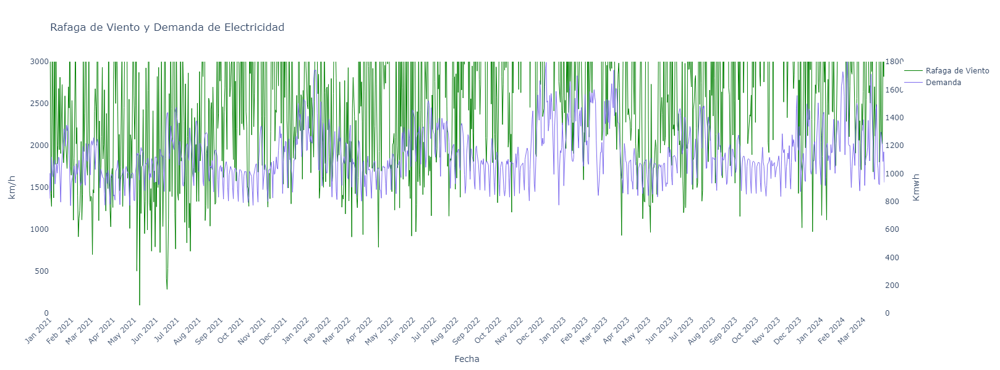

In [69]:
from matplotlib import pyplot as plt
import plotly.graph_objects as go

# Convertir la columna 'Fecha' a tipo datetime
daily_demand['Fecha'] = pd.to_datetime(daily_demand['Fecha'])

# Filtro para seleccionar datos de los años 2022, 2023 y 2024
filtered_data = daily_demand[(daily_demand['Fecha'].dt.year >= 2021) & (daily_demand['Fecha'].dt.year <= 2024)]

plt.style.use('default')
# Crear el gráfico
layout_temp = go.Layout(
    title='Rafaga de Viento y Demanda de Electricidad',
    xaxis=dict(title='Fecha', tickangle=-45, dtick='M1', showgrid=False),
    yaxis=dict(title='km/h', titlefont=dict(size=14), showgrid=False, range=[0, 3000]),  # Ajuste de rango para Temperatura
    yaxis2=dict(title='Kmwh', overlaying='y', side='right', titlefont=dict(size=14), showgrid=False, range=[0, 1800])  # Ajuste de rango para Kmwh
)

Vient = go.Scatter(x=filtered_data['Fecha'], y=filtered_data['Rafaga_viento'], name='Rafaga de Viento', line=dict(color='#008000', width=1), yaxis='y')
dem = go.Scatter(x=filtered_data['Fecha'], y=filtered_data['Demanda'], name='Demanda', line=dict(color='#7B68EE', width=1), yaxis='y2')

# Corregir el nombre de la traza en la figura
fig = go.Figure(data=[Vient, dem], layout=layout_temp)
fig.update_xaxes(title_text='Fecha')

# Configurar el color de fondo del gráfico y el área de trazado en blanco
fig.update_layout(
    paper_bgcolor='white',
    plot_bgcolor='white',
    width=1200,  # Ajustar el ancho del gráfico
    height=600   # Ajustar la altura del gráfico
)

fig.show()

#### LLUVIA ACUMULADA

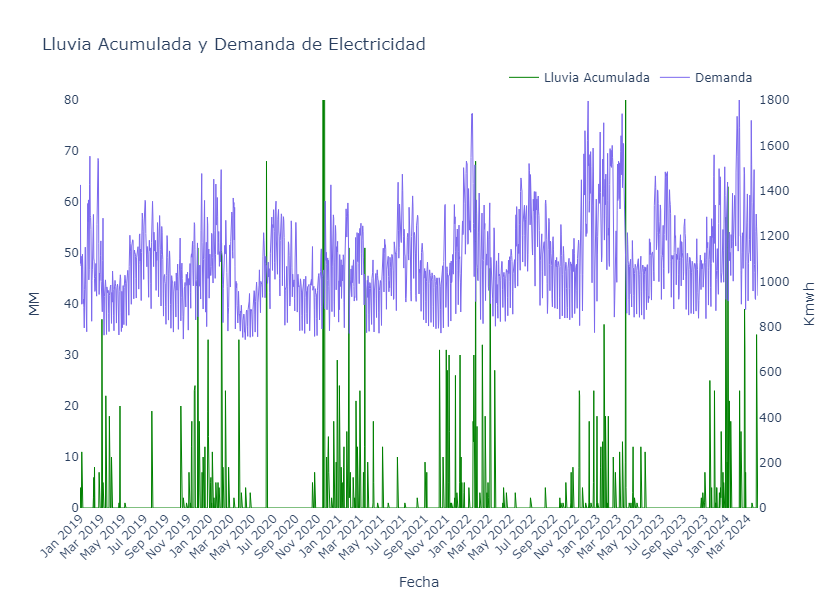

In [11]:
from matplotlib import pyplot as plt
import plotly.graph_objects as go

plt.style.use('default')

# Crear el gráfico
layout_temp = go.Layout(
    title='Lluvia Acumulada y Demanda de Electricidad',
    xaxis=dict(title='Fecha', tickangle=-45, dtick='M2', showgrid=False),
    yaxis=dict(title='MM', titlefont=dict(size=14), showgrid=False, range=[0, 80]),  # Ajuste de rango para Temperatura
    yaxis2=dict(title='Kmwh', overlaying='y', side='right', titlefont=dict(size=14), showgrid=False, range=[0, 1800])  # Ajuste de rango para Kmwh
)

Vient = go.Scatter(x=daily_demand['Fecha'], y=daily_demand['Lluvia_Acumulada'], name='Lluvia Acumulada', line=dict(color='#008000', width=1), yaxis='y')
dem = go.Scatter(x=daily_demand['Fecha'], y=daily_demand['Demanda'], name='Demanda', line=dict(color='#7B68EE', width=1), yaxis='y2')

# Corregir el nombre de la traza en la figura
fig = go.Figure(data=[Vient, dem], layout=layout_temp)
fig.update_xaxes(title_text='Fecha')

# Configurar el color de fondo del gráfico y el área de trazado en blanco
fig.update_layout(
    paper_bgcolor='white',
    plot_bgcolor='white',
    width=1200,  # Ajustar el ancho del gráfico
    height=600,   # Ajustar la altura del gráfico
)

# Ajustar la posición y orientación de la leyenda
fig.update_layout(
    legend=dict(
        orientation="h",  # "h" para horizontal, "v" para vertical
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

fig.show()


#### DEMANDA POR HORA

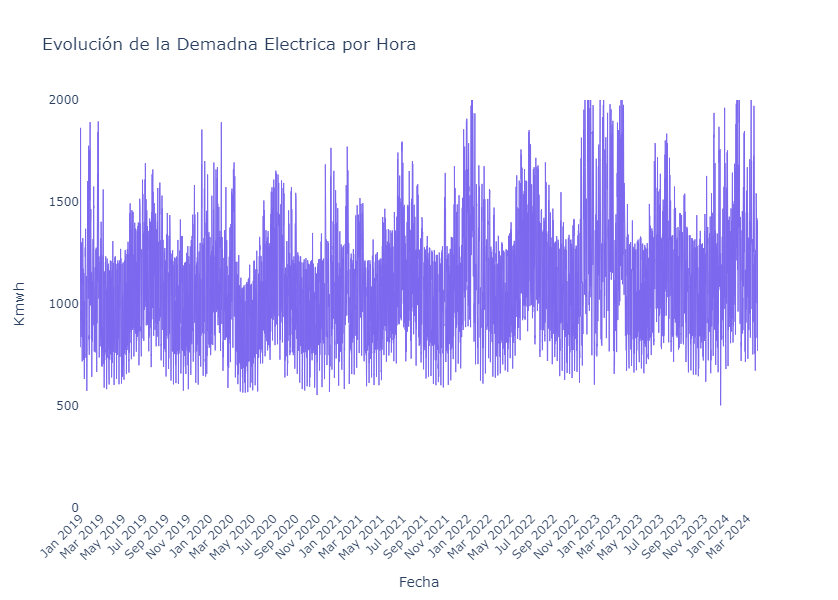

In [12]:
from matplotlib import pyplot as plt
import plotly.graph_objects as go

plt.style.use('default')

# Crear el gráfico
layout_temp = go.Layout(
    title='Evolución de la Demadna Electrica por Hora',
    xaxis=dict(title='Fecha', tickangle=-45, dtick='M2', showgrid=False),
    yaxis=dict(title='Kmwh', titlefont=dict(size=14), showgrid=False, range=[0, 2000]),  # Ajuste de rango para Kmwh
)

# Trama de la demanda en el eje y principal
dem = go.Scatter(x=trainv6['Fecha'], y=trainv6['Demanda'], name='Demanda', line=dict(color='#7B68EE', width=1), yaxis='y')

# Corregir el nombre de la traza en la figura
fig = go.Figure(data=[dem], layout=layout_temp)
fig.update_xaxes(title_text='Fecha')

# Configurar el color de fondo del gráfico y el área de trazado en blanco
fig.update_layout(
    paper_bgcolor='white',
    plot_bgcolor='white',
    width=1200,  # Ajustar el ancho del gráfico
    height=600   # Ajustar la altura del gráfico
)

fig.show()


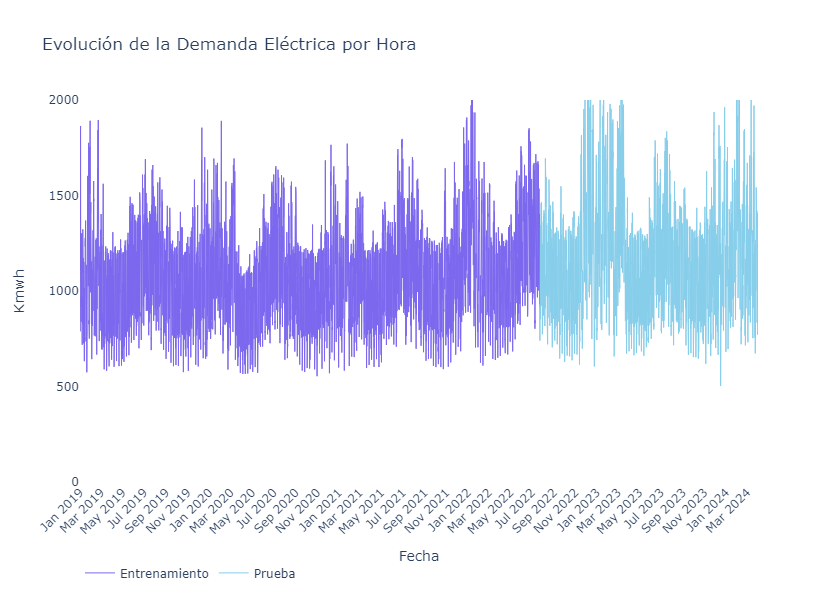

In [13]:
from matplotlib import pyplot as plt
import plotly.graph_objects as go

# Calcular tamaños de entrenamiento y prueba
train_size = int(len(trainv6) * 0.678)
test_size = len(trainv6) - train_size

# Dividir el conjunto de datos
train, test = trainv6.iloc[0:train_size, :], trainv6.iloc[train_size:, :]

plt.style.use('default')

# Crear el gráfico
layout_temp = go.Layout(
    title='Evolución de la Demanda Eléctrica por Hora',
    xaxis=dict(title='Fecha', tickangle=-45, dtick='M2', showgrid=False),
    yaxis=dict(title='Kmwh', titlefont=dict(size=14), showgrid=False, range=[0, 2000]),  # Ajuste de rango para Kmwh
    legend=dict(orientation="h", y=-0.2),  # Posición de la leyenda abajo
)

# Trama de la demanda en el eje y principal para entrenamiento
dem_train = go.Scatter(x=train['Fecha'], y=train['Demanda'], name='Entrenamiento', line=dict(color='#7B68EE', width=1), yaxis='y')

# Trama de la demanda en el eje y principal para prueba
dem_test = go.Scatter(x=test['Fecha'], y=test['Demanda'], name='Prueba', line=dict(color='#87CEEB', width=1), yaxis='y')

# Corregir el nombre de las trazas en la figura
fig = go.Figure(data=[dem_train, dem_test], layout=layout_temp)
fig.update_xaxes(title_text='Fecha')

# Configurar el color de fondo del gráfico y el área de trazado en blanco
fig.update_layout(
    paper_bgcolor='white',
    plot_bgcolor='white',
    width=1200,  # Ajustar el ancho del gráfico
    height=600   # Ajustar la altura del gráfico
)

fig.show()



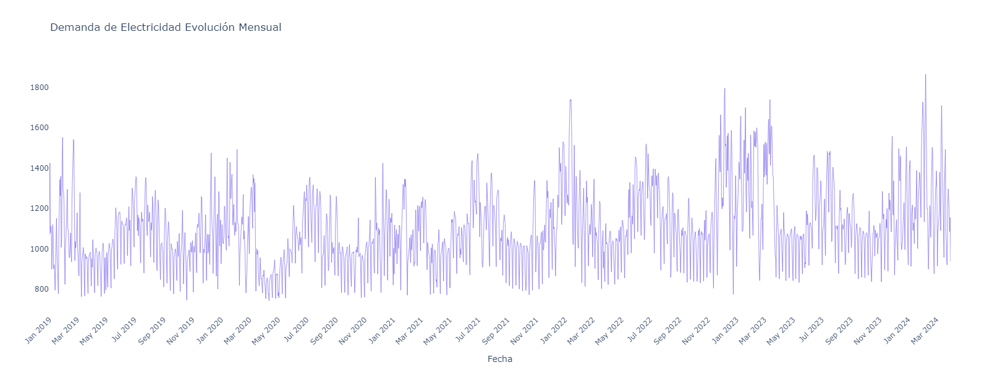

In [62]:
from matplotlib import pyplot as plt
import plotly.graph_objects as go

plt.style.use('default')

# Crear el gráfico
layout_temp = go.Layout(
    title='Demanda de Electricidad Evolución Mensual',
    xaxis=dict(title='Fecha', tickangle=-45, dtick='M2', showgrid=False),
    yaxis=dict(title='Kmwh', overlaying='y', side='right', titlefont=dict(size=14), showgrid=False, range=[0, 1800])  # Ajuste de rango para Kmwh
)


dem = go.Scatter(x=daily_demand['Fecha'], y=daily_demand['Demanda'], name='Demanda', line=dict(color='#7B68EE', width=0.7), yaxis='y2')

fig = go.Figure(data=[dem], layout=layout_temp)
fig.update_xaxes(title_text='Fecha')

# Configurar el color de fondo del gráfico y el área de trazado en blanco
fig.update_layout(
    paper_bgcolor='white',
    plot_bgcolor='white',
    width=1200,  # Ajustar el ancho del gráfico
    height=600   # Ajustar la altura del gráfico
   )

fig.show()



#### DEMANDA POR SEMANA

True


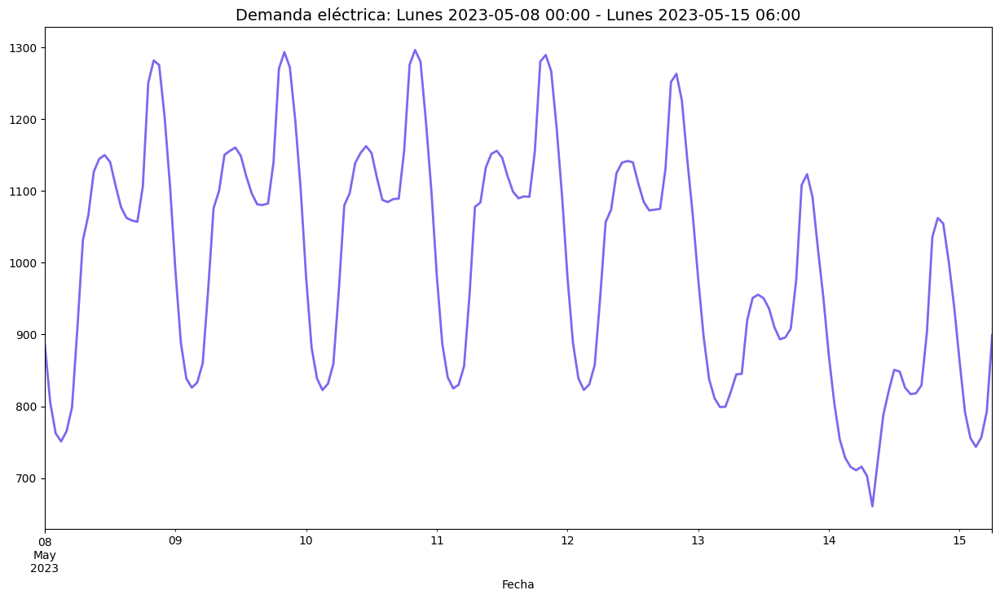

In [15]:
import pandas as pd
from matplotlib import pyplot as plt

# Supongamos que tu DataFrame se llama trainv6 y tiene una columna 'Fecha'
# Reemplaza esto con el nombre real de tu DataFrame y la columna de fecha si es diferente

# Convertir la columna 'Fecha' a tipo datetime si aún no lo está
trainv6['Fecha'] = pd.to_datetime(trainv6['Fecha'])

# Establecer la columna 'Fecha' como índice
trainv6.set_index('Fecha', inplace=True)

# Verificar si la fecha está presente en el índice
print('2023-05-08 00:00:00' in trainv6.index)

# Ahora puedes proceder con la selección de fechas
zoom_aux = ('2023-05-08 00:00:00', '2023-05-15 06:00:00')

plt.figure(figsize=(15, 8))
trainv6.loc[zoom_aux[0]: zoom_aux[1]].Demanda.plot(color='#7B68EE', linewidth=2)

plt.title(f'Demanda eléctrica: Lunes 2023-05-08 00:00 - Lunes 2023-05-15 06:00', fontsize=14)
plt.savefig('Demanda_semana.pdf')
plt.show()



#### DEMANDA DE UN DIA 

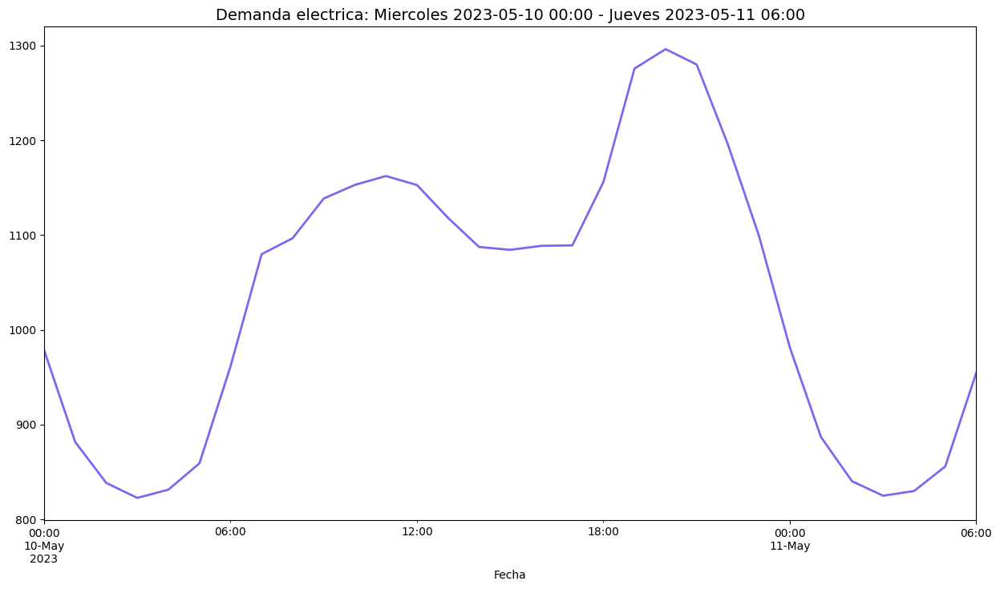

In [16]:
zoom = ('2023-05-10 00:00:00', '2023-05-11 06:00:00')

plt.figure(figsize=(15, 8))

trainv6.loc[zoom[0]: zoom[1]].Demanda.plot(color='#7B68EE', linewidth=2)

plt.title(f'Demanda electrica: Miercoles 2023-05-10 00:00 - Jueves 2023-05-11 06:00', fontsize=14)
plt.savefig('Demanda_dia.pdf')
plt.show()

#### DEMANDA HISTORICA

In [17]:
# Definir el separador y cargar el archivo CSV
separador = ';'
historicov1 = pd.read_csv('./../bases/demandahistorica.csv', sep=separador, encoding='ISO-8859-1')
historicov1['DEMANDA [MWh]'] = historicov1['DEMANDA [MWh]'].str.replace(',', '.').astype(float)
#Mostrar el data frame:
historicov1

,ANO,MES,CATEGORIA AREA,CATEGORIA DEMANDA,TARIFA,CATEGORIA TARIFA,DEMANDA [MWh]
0,2012,1/1/2012,Cordoba,Distribuidor,Alumbrado Publico,Residencial,24181.05
1,2012,1/1/2012,Cordoba,Distribuidor,GRANDES USUARIOS C DEM MAYOR O IGUAL 300KW,Industrial/Comercial Grande,106995.65
2,2012,1/1/2012,Cordoba,Distribuidor,MENOR 10KW NO RES. MAYOR O IGUAL 4000 KWH/BIM,Comercial,29207.40
3,2012,1/1/2012,Cordoba,Distribuidor,MENOR 10KW NO RES. MENOR 4000 KWH BIM,Comercial,73474.47
4,2012,1/1/2012,Cordoba,Distribuidor,RES. MAYOR 1000 Y MENOR O IGUAL 1400 KWH BIM,Residencial,24785.89
...,...,...,...,...,...,...,...
1281,2023,1/12/2023,Cordoba,Distribuidor,TARIFA USU.NO RES. HASTA 10KW Y <=800KWH/MES,Comercial,79443.30
1282,2023,1/12/2023,Cordoba,Distribuidor,TARIFA USU.NO RES. HASTA 10 KW Y > 800KWH/MES,Comercial,37344.06
1283,2023,1/12/2023,Cordoba,Distribuidor,TARIFA BASE ELECTRODEPEND Y BOMBEROS VOLUNTAR,Residencial,726.86
1284,2023,1/12/2023,Cordoba,Distribuidor,CLUBES DE BARRIO Y PRODUCCION AGRICOLA,Comercial,470.02


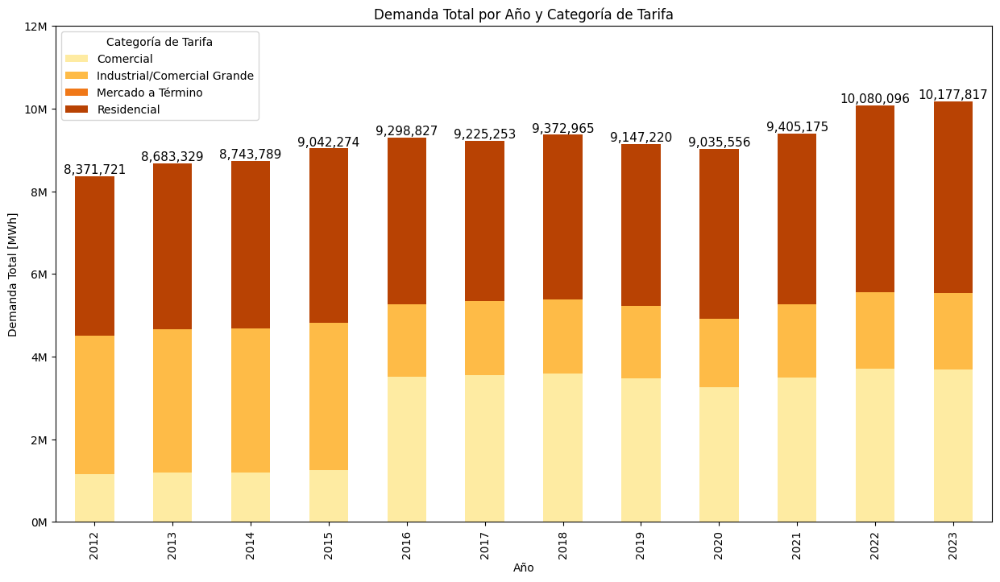

In [64]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter

# Convertir la columna DEMANDA [MWh] a formato numérico
historicov1['DEMANDA [MWh]'] = pd.to_numeric(historicov1['DEMANDA [MWh]'], errors='coerce')

# Añadir una columna ANO para el año
historicov1['ANO'] = historicov1['MES'].str.extract(r'(\d{4})')

# Agrupar por año y categoría de tarifa y sumar la demanda para cada grupo
grouped_data = historicov1.groupby(['ANO', 'CATEGORIA TARIFA']).sum().reset_index()

# Calcular el total de cada año
total_por_ano = grouped_data.groupby('ANO')['DEMANDA [MWh]'].sum().reset_index()

# Paleta de colores terrosos
colors = sns.color_palette("YlOrBr", n_colors=len(grouped_data['CATEGORIA TARIFA'].unique()))

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(15, 8))
ax = grouped_data.pivot(index='ANO', columns='CATEGORIA TARIFA', values='DEMANDA [MWh]').plot(
    kind='bar', stacked=True, ax=ax, color=colors)

# Establecer límite máximo del eje y
ax.set_ylim(0, 12e6)  # Establece el límite máximo del eje y a 12 millones

# Añadir etiquetas a los ejes y leyenda
plt.xlabel('Año')
plt.ylabel('Demanda Total [MWh]')
plt.title('Demanda Total por Año y Categoría de Tarifa')
plt.legend(title='Categoría de Tarifa')

# Añadir total de cada año encima de las barras
for i, year_total in total_por_ano.iterrows():
    ax.text(i, year_total['DEMANDA [MWh]'], f'{int(year_total["DEMANDA [MWh]"]):,}', ha='center', va='bottom', fontsize=11, color='black')

# Personalizar formato del eje y (en millones)
def millions(x, pos):
    'Función para mostrar millones en el eje y'
    return f'{x / 1e6:.0f}M'

formatter = FuncFormatter(millions)
ax.yaxis.set_major_formatter(formatter)

# Mostrar el gráfico
plt.savefig('historica_con_total_grande.pdf')
plt.show()



### Estadísticas

#### Serie desestacionalizada

A continuacion la serie desestacionalizada con un modelo aditivo, la eleccion de la naturaleza de un modelo depende de la naturaleza de la serie temporal y cómo se comportan las componentes estacionales. Si las fluctuaciones estacionales tienen un efecto constante en la serie a lo largo del tiempo, es más apropiado utilizar un modelo aditivo. Si las fluctuaciones estacionales tienen un efecto proporcional en la serie, es más apropiado utilizar un modelo multiplicativo.

##### Modelo Aditivo

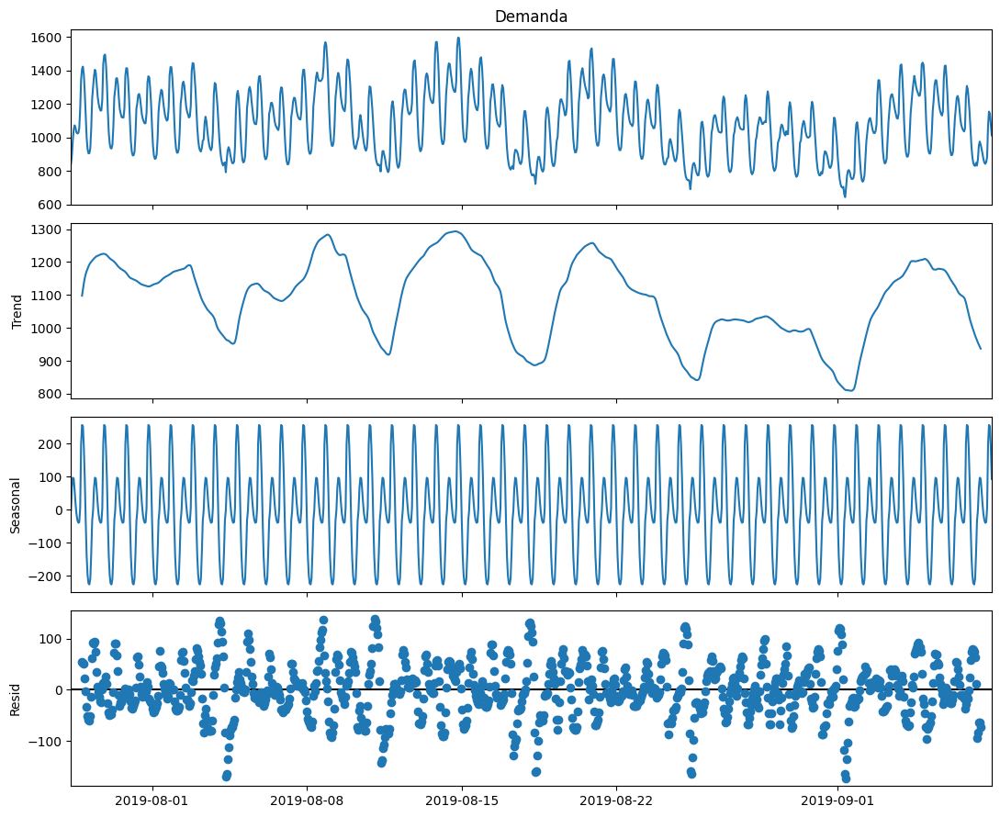

In [19]:
plt.style.use('default')
from statsmodels.tsa.seasonal import seasonal_decompose

# Seleccionar un rango específico de filas
serie_temporal1 = trainv6['Demanda'].iloc[5000:6000]

from pylab import rcParams
rcParams['figure.figsize'] = 11, 9

# Realizar la descomposición estacional
decomposition = seasonal_decompose(serie_temporal1,  model='additive', period=24)

# Graficar los resultados
decomposition.plot()
plt.show()


##### Modelo Multiplicativo

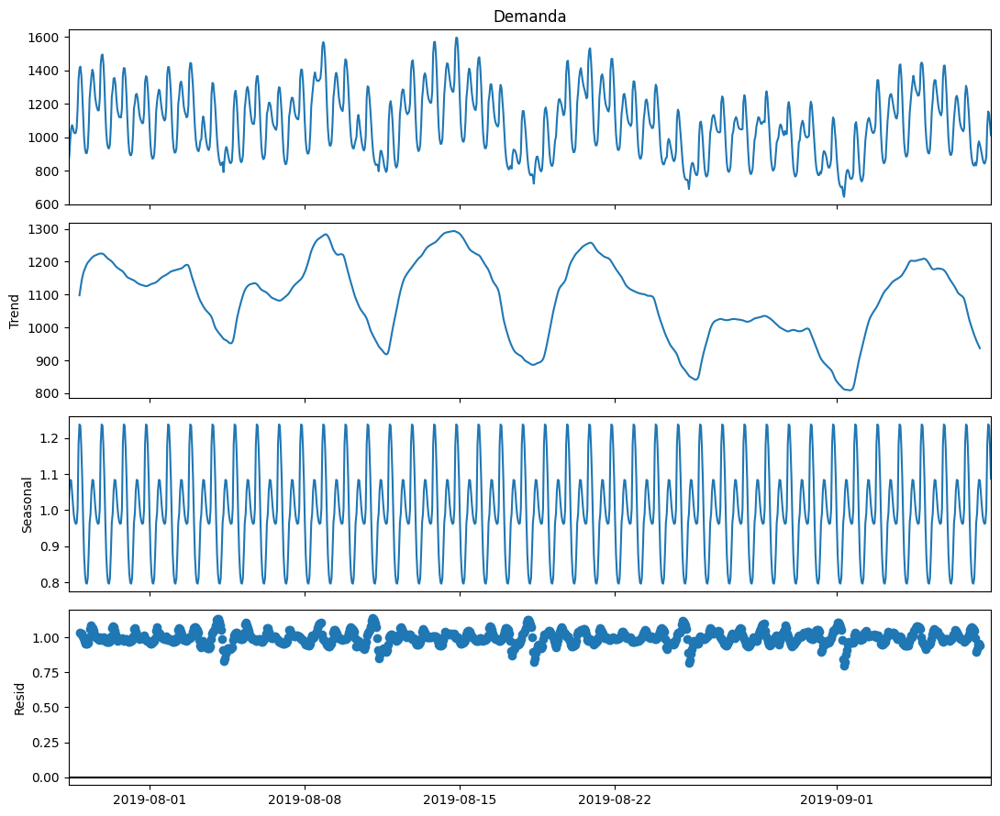

In [20]:
plt.style.use('default')
from statsmodels.tsa.seasonal import seasonal_decompose

# Seleccionar un rango específico de filas
serie_temporal2 = trainv6['Demanda'].iloc[5000:6000]

from pylab import rcParams
rcParams['figure.figsize'] = 11, 9

# Realizar la descomposición estacional
decomposition = seasonal_decompose(serie_temporal2,  model='multiplicative', period=24)

# Graficar los resultados
decomposition.plot()
plt.savefig('multiplicativo.pdf')
plt.show()



##### Comparacion de ambos Modelos: 

In [21]:
# Modelo aditivo
valores_observados_aditivo = serie_temporal1.values
valores_predichos_aditivo = decomposition.trend + decomposition.seasonal

# Cálculo del RMSE (Error Cuadrático Medio)
rmse_aditivo = np.sqrt(np.mean((valores_observados_aditivo - valores_predichos_aditivo) ** 2))

# Cálculo del R-cuadrado (Coeficiente de Determinación)
sst = np.sum((valores_observados_aditivo - np.mean(valores_observados_aditivo)) ** 2)
ssr = np.sum((valores_observados_aditivo - valores_predichos_aditivo) ** 2)
r_cuadrado_aditivo = 1 - (ssr / sst)

# Modelo multiplicativo
valores_observados_multiplicativo = serie_temporal2.values
valores_predichos_multiplicativo = decomposition.trend * decomposition.seasonal

# Cálculo del RMSE (Error Cuadrático Medio)
rmse_multiplicativo = np.sqrt(np.mean((valores_observados_multiplicativo - valores_predichos_multiplicativo) ** 2))

# Cálculo del R-cuadrado (Coeficiente de Determinación)
sst = np.sum((valores_observados_multiplicativo - np.mean(valores_observados_multiplicativo)) ** 2)
ssr = np.sum((valores_observados_multiplicativo - valores_predichos_multiplicativo) ** 2)
r_cuadrado_multiplicativo = 1 - (ssr / sst)

# Mostrar las métricas
print("Métricas para el modelo aditivo:")
print("RMSE (aditivo):", rmse_aditivo)
print("R-cuadrado (aditivo):", r_cuadrado_aditivo)

print("Métricas para el modelo multiplicativo:")
print("RMSE (multiplicativo):", rmse_multiplicativo)
print("R-cuadrado (multiplicativo):", r_cuadrado_multiplicativo)

Métricas para el modelo aditivo:
RMSE (aditivo): 148.61359670361392
R-cuadrado (aditivo): 0.42546523248221224
Métricas para el modelo multiplicativo:
RMSE (multiplicativo): 47.24456009929758
R-cuadrado (multiplicativo): 0.9419365490747893


Las métricas indican que el modelo multiplicativo tiene un RMSE significativamente más bajo (mejor ajuste a los datos y comete errores de predicción más pequeños) y un R-cuadrado más alto (mayor proporción de la variabilidad en los datos se explica mediante este modelo) en comparación con el modelo aditivo. Esto sugiere que el modelo multiplicativo se ajusta mejor a tus datos de serie temporal.

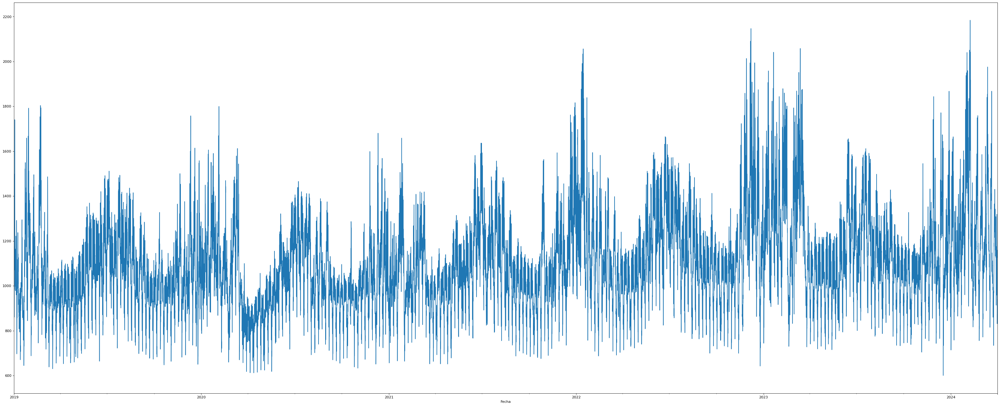

In [22]:
rcParams['figure.figsize'] = 11, 9
plt.figure(num=None, figsize=(50, 20), dpi=80, facecolor='w', edgecolor='k')
deseasonalized = seasonal_decompose(trainv6['Demanda'], model = 'multiplicative', period=24)
dem_deseasonalized = deseasonalized.observed / deseasonalized.seasonal
dem_deseasonalized.plot()
plt.show()

El ADF (Augmented Dickey-Fuller) test, o Prueba de Dickey-Fuller es una prueba de hipótesis estadística utilizada para determinar si una serie de tiempo es estacionaria o no estacionaria. Evaluar si una serie temporal tiene raíces unitarias, lo que indica la presencia de tendencia y no estacionariedad. Una raíz unitaria significa que la serie temporal no tiene una media constante y muestra un comportamiento de tendencia. En otras palabras, la serie está cambiando con el tiempo y no se encuentra en equilibrio.

El ADF test compara la serie temporal original con una versión diferenciada de sí misma. La hipótesis nula (H0) del ADF test es que la serie tiene raíces unitarias, lo que implica que no es estacionaria. La hipótesis alternativa (H1) es que la serie no tiene raíces unitarias, lo que implica que es estacionaria.

La prueba genera un estadístico y un valor p. Si el valor p es lo suficientemente bajo (generalmente por debajo de un umbral predefinido, como 0.05), podemos rechazar la hipótesis nula y concluir que la serie es estacionaria. Si el valor p es alto, no podemos rechazar la hipótesis nula y concluimos que la serie no es estacionaria.

In [23]:
# ADF Test
result = adfuller(dem_deseasonalized, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -14.4396857248773
p-value: 7.394816803398994e-27
Critial Values:
   1%, -3.430492318237683
Critial Values:
   5%, -2.861602901616082
Critial Values:
   10%, -2.5668034804711612


Hay evidencia estadistica suficiente para rechazar la hipotesis nula sobre la existencia de raiz unitaria en la serie,el valor p es lo suficientemente bajo (menor a 0.05), podemos rechazar la hipótesis nula y concluir que la serie es estacionaria.

In [24]:
_ot_19 = pd.date_range('2019-03-21 00:00:00','2019-06-20 23:00:00', freq = 'H')
_ot_20 = pd.date_range('2020-03-21 00:00:00','2020-06-20 23:00:00', freq = 'H')
_ot_21 = pd.date_range('2021-03-21 00:00:00','2021-06-20 23:00:00', freq = 'H')
_ot_22 = pd.date_range('2022-03-21 00:00:00','2022-06-20 23:00:00', freq = 'H')
_ot_23 = pd.date_range('2023-03-21 00:00:00','2023-06-20 23:00:00', freq = 'H')

_spr_19 = pd.date_range('2019-09-21 00:00:00','2019-12-20 23:00:00', freq = 'H')
_spr_20 = pd.date_range('2020-09-21 00:00:00','2020-12-20 23:00:00', freq = 'H')
_spr_21 = pd.date_range('2021-09-21 00:00:00','2021-12-20 23:00:00', freq = 'H')
_spr_22 = pd.date_range('2022-09-21 00:00:00','2022-12-20 23:00:00', freq = 'H')
_spr_23 = pd.date_range('2023-09-21 00:00:00','2023-12-20 23:00:00', freq = 'H')

In [25]:
import matplotlib.pyplot as plt
import numpy as np

# Redondear la columna 'Demanda' a un decimal
trainv6['Demanda'] = trainv6['Demanda'].round(1)

# Realizar la descripción agrupada
descripcion_por_estacion_y_ano = trainv6.groupby(['Estacion', 'Ano'])['Demanda'].describe()

# Redondear el resultado de la descripción
descripcion_por_estacion_y_ano['mean'] = descripcion_por_estacion_y_ano['mean'].round(1)
descripcion_por_estacion_y_ano['std'] = descripcion_por_estacion_y_ano['std'].round(1)
descripcion_por_estacion_y_ano['min'] = descripcion_por_estacion_y_ano['min'].round(1)
descripcion_por_estacion_y_ano['25%'] = descripcion_por_estacion_y_ano['25%'].round(1)
descripcion_por_estacion_y_ano['50%'] = descripcion_por_estacion_y_ano['50%'].round(1)
descripcion_por_estacion_y_ano['75%'] = descripcion_por_estacion_y_ano['75%'].round(1)
descripcion_por_estacion_y_ano['max'] = descripcion_por_estacion_y_ano['max'].round(1)

# Eliminar la columna 'count'
descripcion_por_estacion_y_ano.drop(columns=['count'], inplace=True)

# Restablecer el índice para incluir 'Estacion' y 'Ano' como columnas
descripcion_por_estacion_y_ano.reset_index(inplace=True)

# Colores para el fondo del encabezado y para las estaciones
header_color = 'lightgray'
estacion_colors = ['whitesmoke', 'white']  # Colores alternados para las estaciones

# Crear un gráfico de tabla a partir de la descripción agrupada
fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('tight')
ax.axis('off')
tabla = ax.table(cellText=descripcion_por_estacion_y_ano.values,
                 colLabels=descripcion_por_estacion_y_ano.columns,
                 loc='center', cellLoc='center', colColours=[header_color] * len(descripcion_por_estacion_y_ano.columns))

# Establecer el color de fondo de las filas de las estaciones
for i in range(1, len(descripcion_por_estacion_y_ano)):
    for j in range(len(descripcion_por_estacion_y_ano.columns)):
        color_index = i % len(estacion_colors)
        color = estacion_colors[color_index]
        tabla[(i, j)].set_facecolor(color)  # Filas de las estaciones

# Ajustar el diseño de la tabla
tabla.auto_set_font_size(False)
tabla.set_fontsize(10)
tabla.scale(1.2, 1.2)

# Guardar la tabla como una imagen
plt.savefig('descripcion_por_estacion_y_ano.png', bbox_inches='tight', pad_inches=0.5)
plt.close()


In [26]:
import matplotlib.pyplot as plt
import numpy as np

# Redondear la columna 'Demanda' a un decimal si no lo has hecho previamente
trainv6['Demanda'] = trainv6['Demanda'].round(1)

# Realizar la descripción agrupada
descripcion_por_tipo_dia_y_ano = trainv6.groupby(['Tipo de dia', 'Ano'])['Demanda'].describe()

# Redondear el resultado de la descripción
descripcion_por_tipo_dia_y_ano['mean'] = descripcion_por_tipo_dia_y_ano['mean'].round(1)
descripcion_por_tipo_dia_y_ano['std'] = descripcion_por_tipo_dia_y_ano['std'].round(1)
descripcion_por_tipo_dia_y_ano['min'] = descripcion_por_tipo_dia_y_ano['min'].round(1)
descripcion_por_tipo_dia_y_ano['25%'] = descripcion_por_tipo_dia_y_ano['25%'].round(1)
descripcion_por_tipo_dia_y_ano['50%'] = descripcion_por_tipo_dia_y_ano['50%'].round(1)
descripcion_por_tipo_dia_y_ano['75%'] = descripcion_por_tipo_dia_y_ano['75%'].round(1)
descripcion_por_tipo_dia_y_ano['max'] = descripcion_por_tipo_dia_y_ano['max'].round(1)

# Eliminar la columna 'count'
descripcion_por_tipo_dia_y_ano.drop(columns=['count'], inplace=True)

# Restablecer el índice para incluir 'Tipo de dia' y 'Ano' como columnas
descripcion_por_tipo_dia_y_ano.reset_index(inplace=True)

# Colores para el fondo del encabezado y para los tipos de día
header_color = 'lightgray'
dia_colors = ['whitesmoke', 'white']  # Colores alternados para los tipos de día

# Crear un gráfico de tabla a partir de la descripción agrupada
fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('tight')
ax.axis('off')
tabla = ax.table(cellText=descripcion_por_tipo_dia_y_ano.values,
                 colLabels=descripcion_por_tipo_dia_y_ano.columns,
                 loc='center', cellLoc='center', colColours=[header_color] * len(descripcion_por_tipo_dia_y_ano.columns))

# Establecer el color de fondo de las filas de los tipos de día
for i in range(1, len(descripcion_por_tipo_dia_y_ano)):
    for j in range(len(descripcion_por_tipo_dia_y_ano.columns)):
        color_index = i % len(dia_colors)
        color = dia_colors[color_index]
        tabla[(i, j)].set_facecolor(color)  # Filas de tipos de día

# Ajustar el diseño de la tabla
tabla.auto_set_font_size(False)
tabla.set_fontsize(10)
tabla.scale(1.2, 1.2)

# Guardar la tabla como una imagen
plt.savefig('descripcion_por_tipo_dia_y_ano.png', bbox_inches='tight', pad_inches=0.5)
plt.close()




#### Crear Nueva Variable

In [27]:
# Crear una nueva columna 'Tipo de dia categ' con la categorización
trainv6['Tipo de dia categ'] = trainv6['Tipo de dia'].map({'Feriado': 0, 'sabado': 1, 'Domingo': 3, 'Habil': 2})

# Crear dos grupos según la nueva columna 'Tipo de dia categ'
grupo_fds = trainv6[trainv6['Tipo de dia categ'].isin([0, 1, 3])]
grupo_habil = trainv6[trainv6['Tipo de dia categ'] == 2]

# Extraer las columnas de demanda para cada grupo
demanda_grupo_fds = grupo_fds['Demanda']
demanda_grupo_habil = grupo_habil['Demanda']


# Crear una nueva columna 'Estacion categ' con la categorización
trainv6['Estacion categ'] = trainv6['Estacion'].map({'Verano': 0, 'Primavera': 1, 'Otono': 2, 'Invierno': 3})


# Crear dos grupos según la nueva columna 'Estacion categ'
grupo_verano_invierno = trainv6[trainv6['Estacion categ'].isin([0, 3])]
grupo_primavera_otono = trainv6[trainv6['Estacion categ'].isin([1, 2])]

# Extraer las columnas de demanda para cada grupo
demanda_grupo_verano_invierno = grupo_verano_invierno['Demanda']
demanda_grupo_primavera_otono = grupo_primavera_otono['Demanda']


In [28]:
# Extraer las columnas de demanda para cada grupo
demanda_grupo_fds = grupo_fds['Demanda'].astype(float)
demanda_grupo_habil = grupo_habil['Demanda'].astype(float)

# Ahora, realiza la prueba t de Student en las columnas numéricas
t_stat, p_value = stats.ttest_ind(demanda_grupo_fds, demanda_grupo_habil)

# Print the results
print("t-statistic:", t_stat)
print("p-value:", p_value)


t-statistic: -81.93151971933712
p-value: 0.0


In [29]:
# Extraer solo las columnas numéricas de demanda para cada grupo
demanda_grupo_verano_invierno = grupo_verano_invierno['Demanda']
demanda_grupo_primavera_otono = grupo_primavera_otono['Demanda']

# Realizar la prueba t solo en las columnas numéricas
t_stat, p_value = stats.ttest_ind(demanda_grupo_verano_invierno, demanda_grupo_primavera_otono)

# Print the results
print("t-statistic:", t_stat)
print("p-value:", p_value)

t-statistic: 51.417323029556975
p-value: 0.0


### Analisis de Variables

##### Prueba Augmented Dickey-Fuller (ADF) a las Variables

El Augmented Dickey-Fuller (ADF) test es una prueba de raíz unitaria que se utiliza para determinar si una serie temporal es estacionaria o no. La hipótesis nula del ADF es que la serie temporal tiene una raíz unitaria, es decir, no es estacionaria. Si el valor p (p-value) es menor que un umbral específico (como 0.05), se rechaza la hipótesis nula, lo que sugiere que la serie temporal es estacionaria.

['Fecha', 'Fecha sin hora', 'Fecha-Mes', 'Ano', 'Mes', 'Dia', 'Dia de la semana', 'Hora-num', 'Hora', 'Fecha_columna', 'Demanda', 'Potencia maxima', 'HHMM-num', 'HHMM', 'E valle', 'E resto', 'E pico', 'E total', 'Nombre de la semana', 'Tipo de dia', 'Laborabilidad', 'Estacion', 'Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento']

In [30]:
from statsmodels.tsa.stattools import adfuller
import pandas as pd

# Supongamos que 'HHMM-num' es la columna que contiene las horas en formato '23:00'
# Reemplaza esto con el nombre real de tu DataFrame y la columna si es diferente
trainv6['HHMM-num'] = pd.to_datetime(trainv6['HHMM-num']).dt.hour

# Ahora 'HHMM-num' contendrá solo la hora en formato numérico


columns_to_test = [
    'Ano',
    'Mes',
    'Dia',
    'Dia de la semana',
    'Hora-num',
    'HHMM-num',
    'Potencia maxima',
    'E valle',
    'E resto',
    'E pico',
    'E total',
    'Demanda',
    'Temperatura',
    'Humedad', 
    'Acumulacion de lluvia',
    'Rafaga de viento',
    'Estacion categ',
    'Tipo de dia categ'
]   

# Definir el umbral de significancia para el p-value
p_value_threshold = 0.05

# Listas para almacenar variables estacionarias y no estacionarias
estacionarias = []
no_estacionarias = []

for column in columns_to_test:
    result = adfuller(trainv6[column], autolag='AIC')
    adf_statistic, p_value, _, _, _, _ = result
    
    print(f'ADF Statistic {column}: {adf_statistic}')
    print(f'p-value {column}: {p_value}')

    # Clasificar la variable como estacionaria o no estacionaria
    if p_value <= p_value_threshold:
        estacionarias.append(column)
    else:
        no_estacionarias.append(column)

    print('-' * 50)

# Mostrar listas finales
print("Variables estacionarias:", estacionarias)
print("Variables no estacionarias:", no_estacionarias)


C:\Users\valus\AppData\Local\Temp\ipykernel_12688\1833820621.py:6: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



ADF Statistic Ano: -0.2085970666736245
p-value Ano: 0.9374890814582653
--------------------------------------------------
ADF Statistic Mes: -3.766371467685887
p-value Mes: 0.0032707393320892154
--------------------------------------------------
ADF Statistic Dia: -13.848038373868201
p-value Dia: 7.089363649588226e-26
--------------------------------------------------
ADF Statistic Dia de la semana: -34.257435238479765
p-value Dia de la semana: 0.0
--------------------------------------------------
ADF Statistic Hora-num: -690161883447657.5
p-value Hora-num: 0.0
--------------------------------------------------
ADF Statistic HHMM-num: -19.41460661409026
p-value HHMM-num: 0.0
--------------------------------------------------
ADF Statistic Potencia maxima: -13.85057654892098
p-value Potencia maxima: 7.017381876121608e-26
--------------------------------------------------
ADF Statistic E valle: -10.762966915643904
p-value E valle: 2.493575568118985e-19
----------------------------------

In [31]:
# Verificar valores faltantes
print(trainv6.isnull().sum())


Fecha sin hora           0
Fecha-Mes                0
Ano                      0
Mes                      0
Dia                      0
Dia de la semana         0
Hora-num                 0
Hora                     0
Fecha_columna            0
Demanda                  0
Potencia maxima          0
HHMM-num                 0
HHMM                     0
E valle                  0
E resto                  0
E pico                   0
E total                  0
Nombre de la semana      0
Tipo de dia              0
Laborabilidad            0
Estacion                 0
Temperatura              0
Humedad                  0
Acumulacion de lluvia    0
Rafaga de viento         0
Año                      0
Tipo de dia categ        0
Estacion categ           0
dtype: int64


Ahora sera necesario transformar variables categóricas en variables numéricas. En otras palabras, asigna un número entero único a cada categoría presente en una columna categórica.Cuando trabajas con algoritmos de aprendizaje automático, muchos de ellos requieren que todas las variables de entrada sean numéricas. LabelEncoder es útil en situaciones donde tienes variables categóricas (como nombres de ciudades, tipos de día, estaciones, etc.) y necesitas convertirlas a valores numéricos.

In [32]:
le = preprocessing.LabelEncoder()
trainv6['HHMM'] = le.fit_transform(trainv6['HHMM'])



#### Correlación de las Variables

##### Mapa de calor de Correlación

['Fecha', 'Fecha sin hora', 'Fecha-Mes', 'Ano', 'Mes', 'Dia', 'Dia de la semana', 'Hora-num', 'Hora', 'Fecha_columna', 'Demanda', 'Potencia maxima', 'HHMM-num', 'HHMM', 'E valle', 'E resto', 'E pico', 'E total', 'Nombre de la semana', 'Tipo de dia', 'Laborabilidad', 'Estacion', 'Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento']

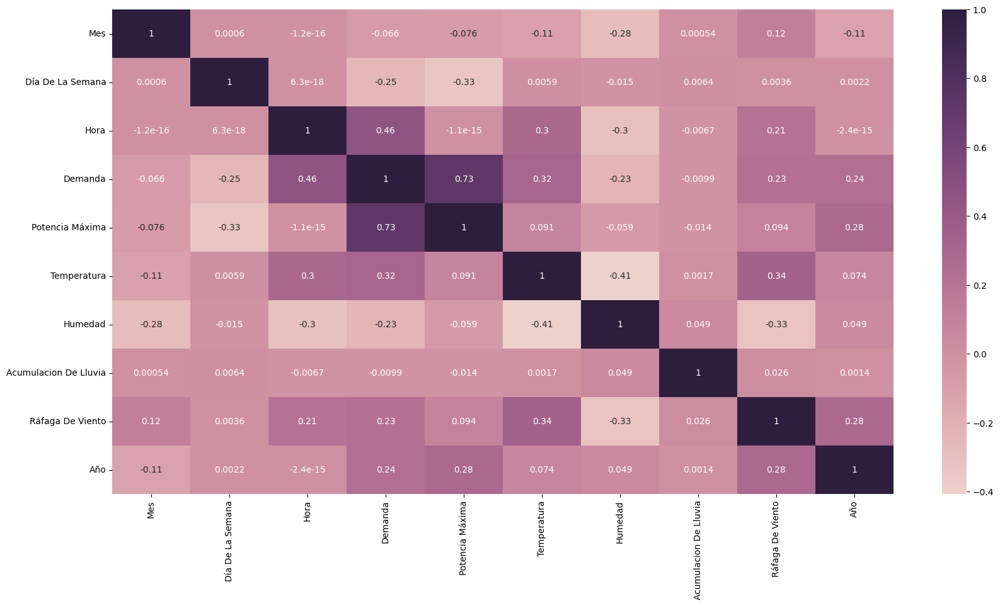

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# Eliminar columnas no deseadas
columns_to_drop = [
    'HHMM', 'E valle', 'E resto', 'E pico', 'E total',
    'Nombre de la semana', 'Tipo de dia', 'Laborabilidad', 'Estacion', 'Ano', 'Estacion categ',
    'Tipo de dia categ', 'HHMM-num','Dia'
]

# Eliminar columnas no deseadas
corr = trainv6.drop(columns=columns_to_drop)

# Renombrar algunas columnas
corr.rename(columns={
    'Hora-num': 'Hora',
    'Potencia maxima': 'Potencia Máxima',
    'Rafaga de viento': 'Ráfaga de Viento',
    'Dia de la semana': 'Día de la semana'
}, inplace=True)

# Calcular la matriz de correlación con el parámetro numeric_only=True
corr_matrix = corr.corr(numeric_only=True)

# Lista de nombres para las etiquetas de los ejes x e y
h_labels = [x.replace('_', ' ').title() for x in list(corr_matrix.columns.values)]

# Crear una figura y establecer el tamaño
fig, ax = plt.subplots(figsize=(20, 10))

# Crear el mapa de calor con anotaciones
sns.heatmap(
    corr_matrix,
    annot=True,
    xticklabels=h_labels,
    yticklabels=h_labels,
    cmap=sns.cubehelix_palette(as_cmap=True),
    ax=ax
)

# Guardar la figura en un archivo PNG (puedes cambiar el formato según tus preferencias)
plt.savefig('corr_adapted.png', bbox_inches='tight', pad_inches=0.5, transparent=True)

# Mostrar el gráfico
plt.show()




In [34]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Selección de las variables independientes
independent_variables = ['Mes', 'Dia de la semana','Hora-num', 'Demanda',
                      'Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Tipo de dia categ', 'Estacion categ']

# Crear un DataFrame con las variables independientes
X = trainv6[independent_variables]

# Calcular el VIF para cada variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


                Variable        VIF
0                    Mes   4.518730
1       Dia de la semana   3.469778
2               Hora-num   5.189069
3                Demanda  24.107373
4            Temperatura  12.290250
5                Humedad   5.736796
6  Acumulacion de lluvia   1.005755
7      Tipo de dia categ   8.889831
8         Estacion categ   3.817833


In [35]:
import seaborn as sns

# Eliminar columnas no deseadas
columns_to_drop = [
        'HHMM', 'E valle', 'E resto', 'E pico', 'E total',
       'Nombre de la semana', 'Tipo de dia', 'Laborabilidad', 'Estacion','Ano','Estacion categ',
    'Tipo de dia categ',  'HHMM-num'
  
]

# Renombrar las columnas deseadas
columns_to_rename = {
    'Cant vendidas aire acondicionados': 'Cantidad Vendidas Aire Acondicionados',
    'Variacion porcentual ': 'Variación EMAE', 'Tipo De Dia Categ': 'Tipo de Día',  'Estacion Categ': 'Estación'
}

# Eliminar columnas no deseadas y renombrar las demás
corr = trainv6.drop(columns=columns_to_drop)
corr.rename(columns=columns_to_rename, inplace=True)

# Calcular la matriz de correlación con el parámetro numeric_only=True
corr_matrix = corr.corr(numeric_only=True)

# Mostrar la tabla de correlación
print(corr_matrix)


                                Mes           Dia  Dia de la semana  \
Mes                    1.000000e+00  1.042737e-02      6.009787e-04   
Dia                    1.042737e-02  1.000000e+00     -1.191431e-03   
Dia de la semana       6.009787e-04 -1.191431e-03      1.000000e+00   
Hora-num              -1.244605e-16 -1.526558e-17      6.271359e-18   
Demanda               -6.597819e-02  1.954229e-02     -2.483419e-01   
Potencia maxima       -7.646750e-02  2.679499e-02     -3.338781e-01   
Temperatura           -1.058247e-01  3.548994e-03      5.872873e-03   
Humedad               -2.796387e-01 -1.358871e-03     -1.519932e-02   
Acumulacion de lluvia  5.431440e-04  3.902153e-03      6.371794e-03   
Rafaga de viento       1.213330e-01 -1.637738e-03      3.607635e-03   
Año                   -1.147228e-01 -9.892039e-04      2.157819e-03   

                           Hora-num   Demanda  Potencia maxima  Temperatura  \
Mes                   -1.244605e-16 -0.065978    -7.646750e-02    -0

ver que variables saco o dejo, por ejemplo la hora, sacarla, sacar tipo de dia categ y estacion categ? ver si solo con la prueba t esta bien , algo asi me sonaba, tambien sacar rafaga de viento si no la pongo, solo lo que pongo

##### Correlación estadisticos Spearman y Kendall

La correlación lineal es un método estadístico que permite cuantificar la relación lineal existente entre dos variables, esta puede ser positiva, negativa o nula.  Existen varios estadísticos, llamados coeficientes de correlación lineal, desarrollados con el objetivo de medir este tipo de asociación, algunos de los más empleados son Pearson, Spearman y Kendall.

La correlación de Kendall es una medida no paramétrica de la relación entre dos variables ordinales. En general, es una buena elección cuando los datos no cumplen con los supuestos de normalidad y la relación no es necesariamente lineal.

En el análisis de correlación de Kendall, una variable se considera no correlacionada cuando el p-value asociado es alto (por ejemplo, mayor a 0.05), lo que sugiere que no hay evidencia estadística suficiente para rechazar la hipótesis nula de no correlación.

las variables que muestran correlación significativa con la demanda pueden ser importantes en la estimación y predicción de la demanda, y su inclusión en modelos predictivos podría mejorar la precisión de las predicciones.

In [36]:
_cols = [ 'Ano', 'Mes', 'Dia', 'Hora-num', 'Dia de la semana', 'Potencia maxima', 'HHMM-num',  'Temperatura', 'Humedad', 'E valle', 'E resto', 'E pico', 'E total', 'Acumulacion de lluvia', 'Rafaga de viento', 'Estacion categ',
    'Tipo de dia categ'
    ]


# Calcular correlaciones con la columna 'Demanda'
for col in _cols:
    if col != 'Demanda':
        corr, p_value = stats.kendalltau(trainv6['Demanda'], trainv6[col])
        corr_spearman, pvalue_spearman = stats.spearmanr(trainv6['Demanda'], trainv6[col])

        print(f"Kendall rank correlation coefficient {col}:", corr)
        print(f"Spearman rank correlation coefficient {col}:", corr_spearman)
        print("p-value:", p_value)
        print("p-value:", pvalue_spearman)
        print("-" * 50)

Kendall rank correlation coefficient Ano: 0.16127892726689363
Spearman rank correlation coefficient Ano: 0.2214242536827974
p-value: 0.0
p-value: 0.0
--------------------------------------------------
Kendall rank correlation coefficient Mes: -0.03883744515595121
Spearman rank correlation coefficient Mes: -0.05593436005636574
p-value: 3.4816069345098545e-33
p-value: 3.276581638280903e-33
--------------------------------------------------
Kendall rank correlation coefficient Dia: 0.014899634518364725
Spearman rank correlation coefficient Dia: 0.022103627348777185
p-value: 2.3875781287021163e-06
p-value: 2.120761549503769e-06
--------------------------------------------------
Kendall rank correlation coefficient Hora-num: 0.3356674759181757
Spearman rank correlation coefficient Hora-num: 0.4963617009560197
p-value: 0.0
p-value: 0.0
--------------------------------------------------
Kendall rank correlation coefficient Dia de la semana: -0.18784789743052796
Spearman rank correlation coeff

##### Coeficiente de Correlación r y r2

In [37]:
import pandas as pd
from sklearn.metrics import r2_score
from scipy.stats import pearsonr

# Lista de variables de interés
variables_of_interest = [
'Ano', 'Mes', 'Dia', 'Hora-num', 'Dia de la semana', 'Potencia maxima', 'HHMM-num',  'Temperatura', 'Humedad', 'E valle', 'E resto', 'E pico', 'E total', 'Acumulacion de lluvia', 'Rafaga de viento', 'Estacion categ',
    'Tipo de dia categ'
]

# Crear un DataFrame con las variables de interés y la columna 'Demanda'
selected_data = trainv6[variables_of_interest + ['Demanda']]

# Función para calcular la correlación
def calculate_correlation(df, target_col):
    corr_matrix = df.corr()
    results_df = pd.DataFrame(index=corr_matrix.columns, columns=['R', 'R2'])

    for col in corr_matrix.columns:
        r, _ = pearsonr(df[col], df[target_col])

        # Calcular R2 de manera diferente para evitar el problema de -Inf o NaN
        y_pred = df[col]
        ssr = sum((y_pred - df[target_col].mean())**2)
        sse = sum((df[target_col] - y_pred)**2)
        r_squared = 1 - (sse/ssr)
        
        results_df.at[col, 'R'] = r
        results_df.at[col, 'R2'] = r_squared

    return results_df

# Calcular la correlación para las variables seleccionadas
results = calculate_correlation(selected_data, 'Demanda')

# Mostrar el DataFrame con los resultados
print(results)



                              R        R2
Ano                    0.239205 -0.068613
Mes                   -0.065978 -0.049153
Dia                    0.019542 -0.049842
Hora-num                0.45899 -0.048226
Dia de la semana      -0.248342 -0.048964
Potencia maxima        0.733431  0.167681
HHMM-num              -0.270468 -0.050617
Temperatura            0.317887 -0.049297
Humedad               -0.227977 -0.056107
E valle                 0.68411  0.010235
E resto                 0.74929  0.005175
E pico                 0.720618  0.009775
E total                0.757947  0.002369
Acumulacion de lluvia -0.009861  -0.04851
Rafaga de viento       0.233174 -0.049455
Estacion categ        -0.100884 -0.048671
Tipo de dia categ     -0.015333 -0.048671
Demanda                     1.0       1.0


In [38]:
# Supongamos que 'trainv6' es tu DataFrame
columnas_trainv6 = trainv6.columns.tolist()

# Muestra la lista de columnas
print(columnas_trainv6)

['Fecha sin hora', 'Fecha-Mes', 'Ano', 'Mes', 'Dia', 'Dia de la semana', 'Hora-num', 'Hora', 'Fecha_columna', 'Demanda', 'Potencia maxima', 'HHMM-num', 'HHMM', 'E valle', 'E resto', 'E pico', 'E total', 'Nombre de la semana', 'Tipo de dia', 'Laborabilidad', 'Estacion', 'Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Rafaga de viento', 'Año', 'Tipo de dia categ', 'Estacion categ']


### RED NEURONAL MULTICAPA LSTM

In [39]:
# Seleccionar las columnas deseadas
columns_to_include = [ 'Mes', 'Dia de la semana','Hora-num', 'Demanda', 'Potencia maxima', 
                      'Temperatura', 'Humedad', 'Acumulacion de lluvia', 'Tipo de dia categ', 'Estacion categ']

# Crear un nuevo DataFrame con las columnas seleccionadas
trainv6LSTM = trainv6[columns_to_include].copy()

# Mostrar las primeras filas del nuevo DataFrame
print(trainv6LSTM.head())


                     Mes  Dia de la semana  Hora-num  Demanda  \
Fecha                                                           
2019-01-01 00:00:00    1                 1         0    969.8   
2019-01-01 01:00:00    1                 1         1    958.9   
2019-01-01 02:00:00    1                 1         2    963.6   
2019-01-01 03:00:00    1                 1         3    956.3   
2019-01-01 04:00:00    1                 1         4    940.4   

                     Potencia maxima  Temperatura  Humedad  \
Fecha                                                        
2019-01-01 00:00:00           1398.9         26.8     65.3   
2019-01-01 01:00:00           1398.9         26.6     65.6   
2019-01-01 02:00:00           1398.9         26.4     66.3   
2019-01-01 03:00:00           1398.9         26.4     66.8   
2019-01-01 04:00:00           1398.9         26.4     68.0   

                     Acumulacion de lluvia  Tipo de dia categ  Estacion categ  
Fecha                        

#### Pre Procesamiento de los datos

In [40]:
 # convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    #df = pd.DataFrame(data)
    df = data
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(data.shift(i))
        names += [('{}(t-{})'.format(j, i)) for j in data.columns]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('{}(t)'.format(j)) for j in data.columns]
        else:
            names += [('{}(t+{})'.format(j, i)) for j in data.columns]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [41]:
def weather_supervised(dataframe, n_in, n_out):
    df = dataframe.copy()
    df.pop('Demanda')
    return series_to_supervised(data = df, n_in = n_in, n_out = n_out, dropnan=True)

def electric_supervised(dataframe, n_in, n_out):
    elec = pd.DataFrame(dataframe['Demanda'])
    elec_sup = series_to_supervised(data = elec, n_in = n_in, n_out = n_out, dropnan=True)
    return elec_sup

In [42]:
Demanda = electric_supervised(trainv6LSTM, 24, 6)
weather = weather_supervised(trainv6LSTM, 24, 6)
full = weather.iloc[:,:-6*9].join(Demanda)

In [43]:
full.columns

Index(['Mes(t-24)', 'Dia de la semana(t-24)', 'Hora-num(t-24)',
       'Potencia maxima(t-24)', 'Temperatura(t-24)', 'Humedad(t-24)',
       'Acumulacion de lluvia(t-24)', 'Tipo de dia categ(t-24)',
       'Estacion categ(t-24)', 'Mes(t-23)',
       ...
       'Demanda(t-4)', 'Demanda(t-3)', 'Demanda(t-2)', 'Demanda(t-1)',
       'Demanda(t)', 'Demanda(t+1)', 'Demanda(t+2)', 'Demanda(t+3)',
       'Demanda(t+4)', 'Demanda(t+5)'],
      dtype='object', length=246)

In [44]:
X = full.iloc[:,:-6]
y = full.iloc[:,-6:]

In [45]:
X.shape, y.shape

((45979, 240), (45979, 6))

In [46]:
mm = MinMaxScaler()
ss = StandardScaler()
X_ss = ss.fit_transform(X)
y_mm = mm.fit_transform(y) 

In [47]:
#We split the data into 2/3 of the time for training and 1/3 for testing 
#which would lead to 2 years for training and one year fo testing
train_hours = int(2*full.shape[0]/3)

X_train = X_ss[:train_hours, :]
X_test = X_ss[train_hours:, :]
y_train = y_mm[:train_hours, :]
y_test = y_mm[train_hours:, :]

#to tensors and variables
X_train_tensors = Variable(torch.Tensor(X_train))
X_test_tensors = Variable(torch.Tensor(X_test))

y_train_tensors = Variable(torch.Tensor(y_train))
y_test_tensors = Variable(torch.Tensor(y_test)) 

In [48]:
#reshaping to rows, timestamps, features
seq = 1
X_train_tensors_final = torch.reshape(X_train_tensors,   (int(X_train_tensors.shape[0]/seq), seq, X_train_tensors.shape[1]))
X_test_tensors_final = torch.reshape(X_test_tensors,  (int(X_test_tensors.shape[0]/seq), seq, X_test_tensors.shape[1])) 

In [49]:
X_train_tensors_final.shape

torch.Size([30652, 1, 240])

#### Construcción del Modelo

In [50]:
class LSTM_E_2(nn.Module):
    def __init__(self, num_classes, input_size, hidden_size, num_layers, seq_length, num_dir, device):
        super(LSTM_E_2, self).__init__()

        self.device = device
        self.num_classes = num_classes #number of outputs
        self.num_layers = num_layers #number of layers
        self.input_size = input_size #input size
        self.hidden_size = hidden_size #hidden state
        self.seq_length = seq_length #sequence length
        self.num_directions = num_dir

        if num_dir == 2:
            bi = True
        else: 
            bi = False

        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                          num_layers=num_layers, batch_first=True, bidirectional = bi ) #lstm
        self.fc_1 =  nn.Linear(hidden_size*num_dir, 300) #fully connected 1
        self.fc = nn.Linear(300, num_classes) #fully connected last layer

        self.relu = nn.ReLU() 

    def forward(self,x):
        h_0 = Variable(torch.zeros(
              self.num_layers*self.num_directions, x.size(0), self.hidden_size)).to(self.device) #hidden state
        c_0 = Variable(torch.zeros(
            self.num_layers*self.num_directions, x.size(0), self.hidden_size)).to(self.device) #internal state

        # Propagate input through LSTM
        output, (hn, cn) = self.lstm(x, (h_0, c_0)) #lstm with input, hidden, and internal state
        #print(output.shape)
        out = output.view(-1, self.hidden_size*self.num_directions) #reshaping the data for Dense layer next
        #print(out.shape)
        out = self.relu(out)
        out = self.fc_1(out) #first Dense
        out = self.relu(out) #relu
        out = self.fc(out) #Final Output
        #print(out.shape)
        
        return out 

In [51]:
#checking if there are any saved model checkpoint
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
    
if os.path.isfile('./data/models/model_2_checkpoint.tar'):
    #load the model
    model = LSTM_E_2(num_classes = 6, input_size = X_train_tensors_final.shape[2], hidden_size=133, num_layers=1, seq_length=X_train_tensors_final.shape[1],  num_dir = 1, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    model.to(device)
    # Make sure to call input = input.to(device) on any input tensors that you feed to the model

    checkpoint = torch.load('./data/models/model_2_checkpoint.tar', map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    loss = checkpoint['loss']
    print(model)
    
else:
    model = LSTM_E_2(num_classes = 6, input_size = X_train_tensors_final.shape[2], hidden_size=133, num_layers=1, seq_length=X_train_tensors_final.shape[1],  num_dir = 1, device=device)
    model.to(device)
    print(model)

LSTM_E_2(
  (lstm): LSTM(240, 133, batch_first=True)
  (fc_1): Linear(in_features=133, out_features=300, bias=True)
  (fc): Linear(in_features=300, out_features=6, bias=True)
  (relu): ReLU()
)


In [52]:
learning_rate = 0.001 #0.001 lr
criterion = torch.nn.MSELoss()    # mean-squared error for regression
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate) 
num_epochs = 700 

Epoch: 0, loss: 0.11256, val_loss: 0.13504
Epoch: 50, loss: 0.00156, val_loss: 0.00203
Epoch: 100, loss: 0.00077, val_loss: 0.00128
Epoch: 150, loss: 0.00056, val_loss: 0.00104
Epoch: 200, loss: 0.00045, val_loss: 0.00089
Epoch: 250, loss: 0.00038, val_loss: 0.00079
Epoch: 300, loss: 0.00033, val_loss: 0.00073
Epoch: 350, loss: 0.00029, val_loss: 0.00068
Epoch: 400, loss: 0.00026, val_loss: 0.00064
Epoch: 450, loss: 0.00023, val_loss: 0.00062
Epoch: 500, loss: 0.00021, val_loss: 0.00060
Epoch: 550, loss: 0.00020, val_loss: 0.00059
Epoch: 600, loss: 0.00019, val_loss: 0.00059
Epoch: 650, loss: 0.00017, val_loss: 0.00058


Text(0, 0.5, 'MSE loss')

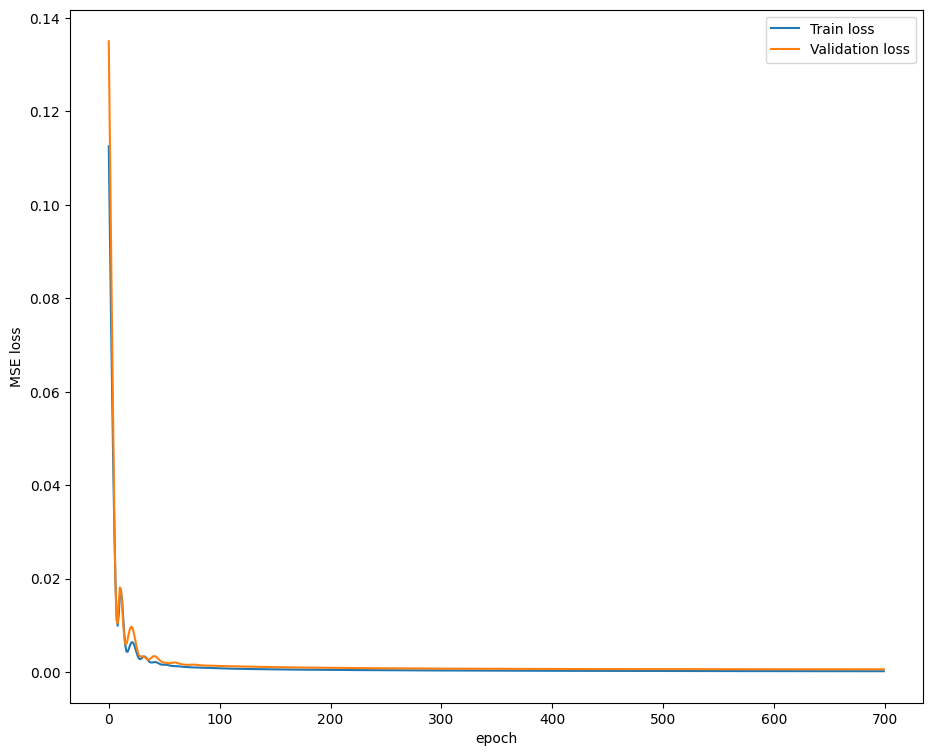

In [53]:
#train 1
model.train()

train_loss = []
val_loss = []
X_test_tensors_final = X_test_tensors_final.to(device)
y_test_tensors = y_test_tensors.to(device)
X_train_tensors_final = X_train_tensors_final.to(device)
y_train_tensors = y_train_tensors.to(device)

for epoch in range(num_epochs):
    outputs = model.forward(X_train_tensors_final)  # forward pass
    optimizer.zero_grad()  # calculate the gradient, manually setting to 0
    # obtain the batch loss 
    loss = criterion(outputs, y_train_tensors)
    train_loss.append(loss.item())
    loss.backward()  # calculates the loss of the loss function
    optimizer.step()  # improve from loss, i.e backpropagation

    # validation
    val_out = model.forward(X_test_tensors_final)
    loss_val = criterion(val_out, y_test_tensors)
    val_loss.append(loss_val.item())

    if epoch % 50 == 0:
        print("Epoch: %d, loss: %1.5f, val_loss: %1.5f" % (epoch, train_loss[epoch], val_loss[epoch])) 

# plotting
epoch = np.arange(0, num_epochs)
plt.plot(epoch, train_loss, label="Train loss")
plt.plot(epoch, val_loss, label="Validation loss")
plt.legend()
plt.xlabel('epoch')
plt.ylabel('MSE loss')


In [54]:
#to save model you'll have to train/keep training the model
torch.save({
            'epoch': len(epoch),
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss.item(),
            }, r'D:\modelo\tu_modelo_checkpoint.tar')

In [55]:
# Obtener las predicciones del modelo en el conjunto de prueba
y_pred = mm.inverse_transform(model(X_test_tensors_final).detach().numpy())

# Obtener las etiquetas verdaderas del conjunto de prueba
y_true = mm.inverse_transform(y_test_tensors.detach().numpy())

# Calcular el RMSE
rmse = np.sqrt(np.mean((y_true - y_pred)**2))

print("RMSE:", rmse)


RMSE: 43.146973


In [56]:
import numpy as np

# Supongamos que la columna "Demanda" contiene tus datos originales
datos_originales = trainv6['Demanda'].values

# Calcula la desviación estándar de los datos originales
std_original = np.std(datos_originales)

# Imprime la desviación estándar
print("Desviación estándar de los datos originales:", std_original)


Desviación estándar de los datos originales: 241.97176141102779


In [57]:
# Imprime la desviación estándar y el RMSE
print("Desviación estándar de los datos originales:", std_original)
print("RMSE del modelo:", rmse)

# Compara el RMSE con la desviación estándar
if rmse < std_original:
    print("El modelo parece estar realizando bien en términos relativos.")
else:
    print("El modelo podría mejorar, ya que el RMSE es significativamente mayor que la desviación estándar.")


Desviación estándar de los datos originales: 241.97176141102779
RMSE del modelo: 43.146973
El modelo parece estar realizando bien en términos relativos.


#### Validación del modelo 

In [58]:
df_X_ss = ss.transform(full.iloc[:,:-6]) #old transformers
df_y_mm = mm.transform(full.iloc[:,-6:]) #old transformers
df_X_ss = Variable(torch.Tensor(df_X_ss)) #converting to Tensors
df_y_mm = Variable(torch.Tensor(df_y_mm))
#reshaping the dataset
df_X_ss = torch.reshape(df_X_ss, (df_X_ss.shape[0], 1, df_X_ss.shape[1])) 

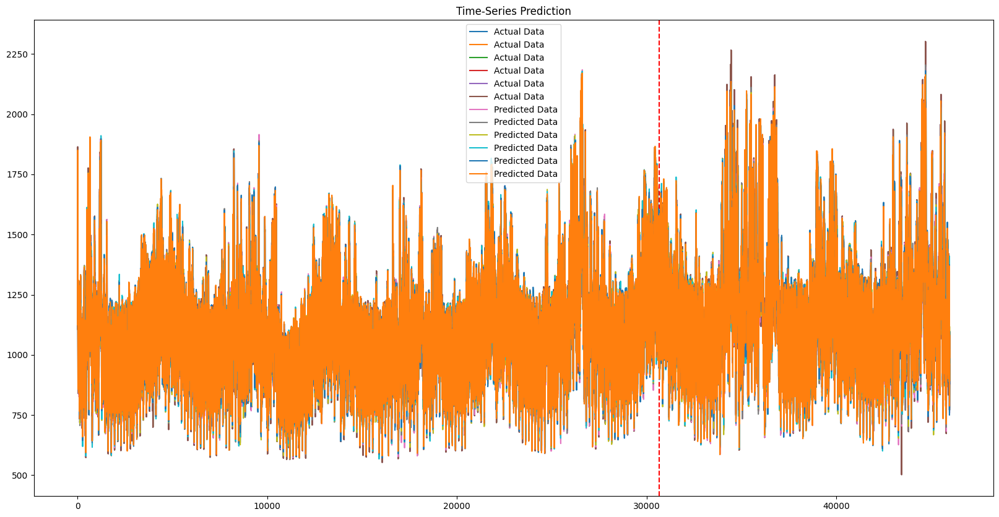

Test RMSE: 31.264


In [70]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

model.eval()

train_predict = model(df_X_ss.to(device))  # forward pass
data_predict = train_predict.cpu().data.numpy()  # numpy conversion
dataY_plot = df_y_mm.data.numpy()

data_predict = mm.inverse_transform(data_predict)  # reverse transformation
dataY_plot = mm.inverse_transform(dataY_plot)

plt.figure(figsize=(20, 10))  # plotting
plt.axvline(x=train_hours, c='r', linestyle='--')  # size of the training set

plt.plot(dataY_plot, label='Actual Data')  # actual plot
plt.plot(data_predict, label='Predicted Data')  # predicted plot
plt.title('Time-Series Prediction')
plt.legend()

# Guardar el gráfico como un archivo PNG
plt.savefig('time_series_prediction.png')

plt.show()

rmse = np.sqrt(mean_squared_error(dataY_plot, data_predict))
print('Test RMSE: %.3f' % rmse)


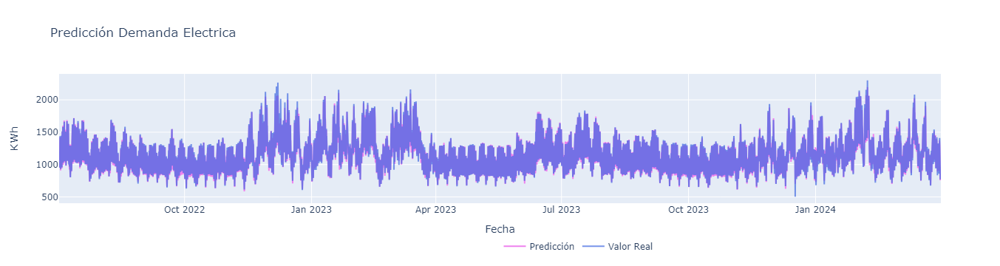

In [67]:
import plotly.graph_objs as go

# Define los datos para la predicción y los valores reales
Predicted = go.Scatter(x=y[train_hours:].index, y=data_predict[train_hours:,0].flatten(), opacity=1, name='Predicción', line=dict(color='violet'), yaxis='y')
Actual = go.Scatter(x=y[train_hours:].index, y=y['Demanda(t)'][train_hours:].values, opacity=0.7, name='Valor Real', line=dict(color='royalBlue'), yaxis='y')

# Define el diseño del gráfico
layout = go.Layout(title='Predicción Demanda Electrica', xaxis=dict(title='Fecha'),
                   yaxis=dict(title='KWh', overlaying='y'),
                   yaxis2=dict(title='KWh', side='right'),
                   legend=dict(orientation='h', x=0.5, y=-0.25))  # Posiciona la leyenda en la parte inferior del gráfico

# Crea el objeto de la figura
fig = go.Figure(data=[Predicted, Actual], layout=layout)

# Muestra el gráfico
fig.show()


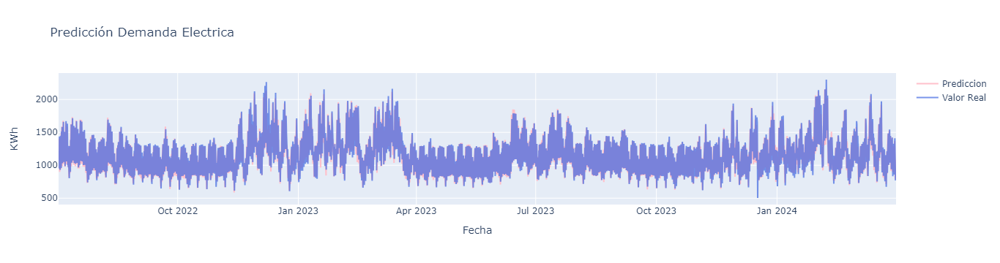

In [66]:
Predicted = go.Scatter(x=y[train_hours:].index, y=data_predict[train_hours:,5].flatten(), opacity = 1, name = 'Prediccion', line=dict(color='pink'), yaxis='y')
Actual = go.Scatter(x=y[train_hours:].index, y=y['Demanda(t)'][train_hours:].values, opacity = 0.7, name = 'Valor Real', line=dict(color='royalBlue'), yaxis='y')
layout = go.Layout(title='Predicción Demanda Electrica', xaxis=dict(title='Fecha'),
                   yaxis=dict(title='KWh', overlaying='y'),
                  yaxis2=dict(title='KWh', side='right'))
fig = go.Figure(data=[Predicted, Actual], layout=layout)
fig.show() # if this is rendered in colab, you should run fig.show(renderer='colab') instead.